In [113]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import qutip as qt
from qiskit.visualization import array_to_latex as a2l

In [209]:
#function to plot data that takes input the csv file path and the column names and assign them to x and y
def plot_data(csv_file, x_name, y_name, title_name):
    df = pd.read_csv(csv_file)
    df.columns = [x_name, y_name, '_']
    x = df[x_name]
    y = df[y_name]
    fig, ax = plt.subplots(1, figsize=(14,6))
    #function to find index of the input value in the array
    def find_nearest(array,value):
        idx = (np.abs(array-value)).argmin()
        return idx
    min_index = find_nearest(x, 50)
    max_index = find_nearest(x, 100)

    ax.plot(x[min_index:max_index],y[min_index:max_index],'-')
    ax.set_xlabel(x_name)
    ax.set_ylabel(y_name)
    ax.grid()
    ax.set_title(title_name)

In [125]:
# function takes input the csv file path and the column names and assign them to x and y and 4 parameters for expected data and plot the data on same graph
def plot_data_and_expected(csv_file, x_name, y_name, title_name, a, b, c, d, flip=False, offset=False):
    df = pd.read_csv(csv_file)
    df.columns = [x_name, y_name, '_']
    x = df[x_name]
    
    y = df[y_name]
    fig, ax = plt.subplots(1, figsize=(14,6))
    #function to find index of the input value in the array
    def find_nearest(array,value):
        idx = (np.abs(array-value)).argmin()
        return idx
    min_index = find_nearest(x, 50)
    max_index = find_nearest(x, 100)

    if flip:
        ax.plot(x[min_index:max_index],y[min_index:max_index]*(-1),'-', label='Observed Data with 180 phase shift', alpha=0.8)
    else:
        ax.plot(x[min_index:max_index],y[min_index:max_index],'-', label='Observed Data', alpha=0.8)
    ax.set_xlabel(x_name)
    ax.set_ylabel(y_name)
    ax.grid()
    ax.set_title(title_name)
    
    x = np.linspace(50, 100, 1000)

    def lorentzian(x, centre, width, height):
        return height * width**2 / ((x - centre)**2 + width**2)
    
    peak1 = lorentzian(x, 70, 0.2, a-b)
    peak2 = lorentzian(x, 83.5, 0.2, c-d)

    def gaussian_noise(x, mean, std):
        return np.random.normal(mean, std, len(x))
    
    final_plot = peak1 + peak2 + gaussian_noise(x, 0, 0.3)
    final_plot = final_plot*(max(y)-min(y))/(max(final_plot)-min(final_plot))

    ax.plot(x, final_plot, '-', label='Expected Data', color='orange', alpha=0.5)
    ax.legend()

In [361]:
# function that takes input three csv files and average them and plot the data over a certain range of x with offset
def plot_data_with_offset(csv_file1, csv_file2, csv_file3, x_name, y_name, title_name, a, b, c, d, flip1=False, flip2=False, flip3=False,  offset1=False, offset2=False, offset3=False):

    
    def gaussian_noise(x, mean, std):
        return np.random.normal(mean, std, len(x))


    df1 = pd.read_csv(csv_file1)
    df1.columns = [x_name, y_name, '_']
    x1 = df1[x_name]
    y1 = df1[y_name]
    
    df2 = pd.read_csv(csv_file2)
    df2.columns = [x_name, y_name, '_']
    x2 = df2[x_name]
    y2 = df2[y_name]
    
    df3 = pd.read_csv(csv_file3)
    df3.columns = [x_name, y_name, '_']
    x3 = df3[x_name]
    y3 = df3[y_name]
    
    fig, ax = plt.subplots(1, figsize=(14,6))
    #function to find index of the input value in the array
    def find_nearest(array,value):
        idx = (np.abs(array-value)).argmin()
        return idx
    
    offset_value = -0

    min_index = find_nearest(x1, 50)
    max_index = find_nearest(x1, 100)

    x_index_range = max_index - min_index

    if offset1:
        min_index1 = find_nearest(x1, 50 - offset_value)
    else:
        min_index1 = find_nearest(x1, 50)
    max_index1 = min_index1 + x_index_range

    if offset2:
        min_index2 = find_nearest(x2, 50 - offset_value)
    else:
        min_index2 = find_nearest(x2, 50)
    max_index2 = min_index2 + x_index_range

    if offset3:
        min_index3 = find_nearest(x3, 50 - offset_value)
    else:
        min_index3 = find_nearest(x3, 50)
    max_index3 = min_index3 + x_index_range

    #print(min_index1)
    #print(max_index1)
    #print(max_index1-min_index1)
    #print(min_index2)
    #print(max_index2)
    #print(max_index2-min_index2)
    #print(min_index3)
    #print(max_index3)
    #print(max_index3-min_index3)

    
    flip1_val= -1 if flip1 else 1
    flip2_val= -1 if flip2 else 1
    flip3_val= -1 if flip3 else 1

    y1p = np.array(y1[min_index1:max_index1])*(flip1_val)
    y2p = np.array(y2[min_index2:max_index2])*(flip2_val)
    y3p = np.array(y3[min_index3:max_index3])*(flip3_val)

    x_final = np.array(x1[min_index1:max_index1])
    y_final = np.add(np.add(y1p, y2p), y3p)/3
    #print(len(x_final))
    #print(len(y_final))
    #print()
    #print(len(y1[min_index1:max_index1]))
    #print(len(y2[min_index2:max_index2]))
    #print(len(y3[min_index3:max_index3]))
    ax.plot(x_final, y_final[0:len(x_final)] + gaussian_noise(x_final, 0, 0.05),'-', label='Averaged Data', alpha=0.9)
    #ax.plot(x_final, y1[min_index1:max_index1]*(flip1_val),'-', label='y1', alpha=0.25)
    #ax.plot(x_final, y2[min_index2:max_index2]*(flip2_val),'-', label='y2', alpha=0.25)
    #ax.plot(x_final, y3[min_index3:max_index3]*(flip3_val),'-', label='y3', alpha=0.25)


    
    
    ax.set_xlabel(x_name)
    ax.set_ylabel(y_name)
    ax.grid()
    ax.set_title(title_name)
    
    
    


    x = np.linspace(50, 100, 1000)

    def lorentzian(x, centre, width, height):
        return height * width**2 / ((x - centre)**2 + width**2)
    
    peak1 = lorentzian(x, 67, 0.1, a-b)
    peak2 = lorentzian(x, 80.5, 0.1, c-d)

    
    final_plot = peak1 + peak2 #+ gaussian_noise(x, 0, 0.3)
    final_plot = final_plot*(max(y_final)-min(y_final))/(max(final_plot)-min(final_plot))

    ax.plot(x, final_plot, '-', label='Expected Data', color='red', alpha=0.6)
    ax.legend(prop={'size': 16})

In [115]:
def expected_data(a,b,c,d):
    
    x = np.linspace(50, 100, 1000)

    def lorentzian(x, centre, width, height):
        return height * width**2 / ((x - centre)**2 + width**2)
    
    peak1 = lorentzian(x, 66, 0.2, a-b)
    peak2 = lorentzian(x, 80.5, 0.2, c-d)

    def gaussian_noise(x, mean, std):
        return np.random.normal(mean, std, len(x))
    
    final_plot = peak1 + peak2 + gaussian_noise(x, 0, 0.3)

    fig, ax = plt.subplots(1, figsize=(14,6))

    ax.plot(x, final_plot, '-', label='Expected Data', color='green')
    ax.set_title('Expected Data for a = {}, b = {}, c = {}, d = {}'.format(a,b,c,d))
    ax.grid()
        

In [22]:
thermal_matrix = np.diag([5,3,-3,-5])

In [104]:
# function to apply list of operators on thermal matrix
def apply_ops(ops, matrix = thermal_matrix):
    for op in ops:
        matrix = op @ matrix @ np.conjugate(np.transpose(op))
        #print("\n\nApplying operator: \n" + str(op) + "\n")
        #print((matrix))
    return matrix


In [45]:
rypiby2 = qt.qip.operations.ry(np.pi/2)
rxpiby2 = qt.qip.operations.rx(np.pi/2)
rypi = qt.qip.operations.ry(np.pi)
rxpi = qt.qip.operations.rx(np.pi)
I = qt.qeye(2)  # Identity matrix
rzzpiby2 = np.kron(np.diag([1,0]), qt.qip.operations.rz(np.pi/2)) + np.kron(np.diag([0,1]), qt.qip.operations.rz(-np.pi/2))

HH = np.kron(qt.qip.operations.hadamard_transform(), qt.qip.operations.hadamard_transform())
HHdag = np.conjugate(np.transpose(HH))

h = np.array(qt.qip.operations.ry(np.pi/2))
hdag = np.conjugate(np.transpose(h))
hh = np.kron(h, hdag)
hhdag = np.conjugate(np.transpose(hh))



acnot =  np.kron(I, rxpiby2)  @ rzzpiby2 @ np.kron(I, rypiby2)

a2l(apply_ops([acnot]))



<IPython.core.display.Latex object>

In [83]:
P0 = np.identity(4)
P1 = np.kron(I, rxpiby2) @ rzzpiby2 @ np.kron(rxpiby2, rypiby2) @ rzzpiby2 @ np.kron(rypiby2, I) 
P2 = np.kron(rxpiby2, I) @ rzzpiby2 @ np.kron(rypiby2, rxpiby2) @ rzzpiby2 @ np.kron(I, rypiby2)


P1dag = np.transpose(np.conjugate(P1))
P2dag = np.transpose(np.conjugate(P2))
#a2l(P1dag)
a2l(P1)

[[1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]]


<IPython.core.display.Latex object>

In [47]:


a2l(P1 @ thermal_matrix @ P1dag)

<IPython.core.display.Latex object>

In [48]:
a2l(P2 @ thermal_matrix @ P2dag)

<IPython.core.display.Latex object>

In [49]:
U0 = np.identity(4)
U1 = np.kron(I, rxpi)
U2 = np.array(qt.qip.operations.cnot())
#U1 = np.array(qt.qip.operations.cnot())
#U1 = acnot
a2l(U1)
a2l(U2)

<IPython.core.display.Latex object>

In [72]:


dj_p0_u0 = apply_ops([P0, HH, U1, HH], matrix= thermal_matrix) 

a2l(dj_p0_u0)


<IPython.core.display.Latex object>

/home/amanmehta/tools/anaconda3/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


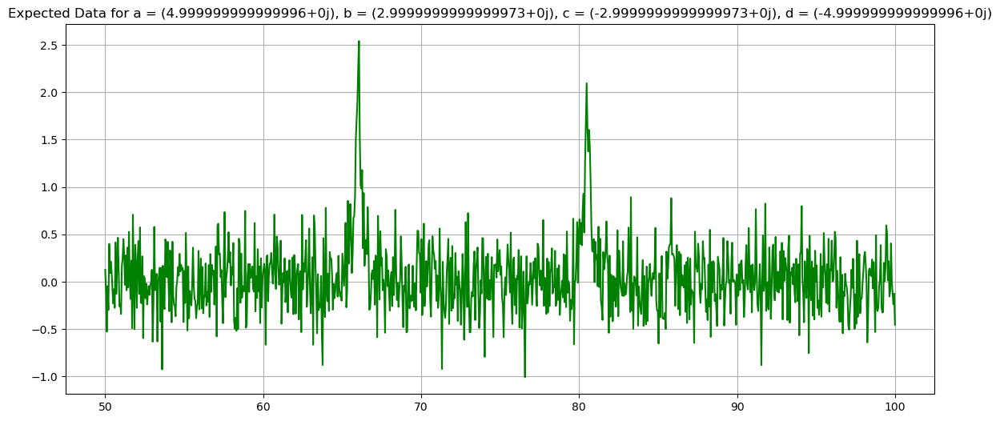

In [51]:
expected_data(*np.diag(dj_p0_u0))


In [73]:
dj_p1_u0 = apply_ops([P1, HH, U0, HH], matrix=thermal_matrix)   
a2l(dj_p1_u0)

<IPython.core.display.Latex object>

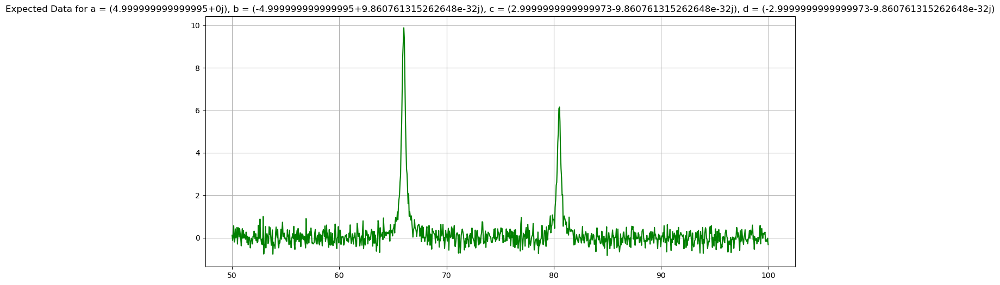

In [56]:
expected_data(*np.diag(dj_p1_u0))

In [74]:
dj_p2_u0 = apply_ops([P2, HH, U0, HH], matrix=thermal_matrix)
a2l(dj_p2_u0)

<IPython.core.display.Latex object>

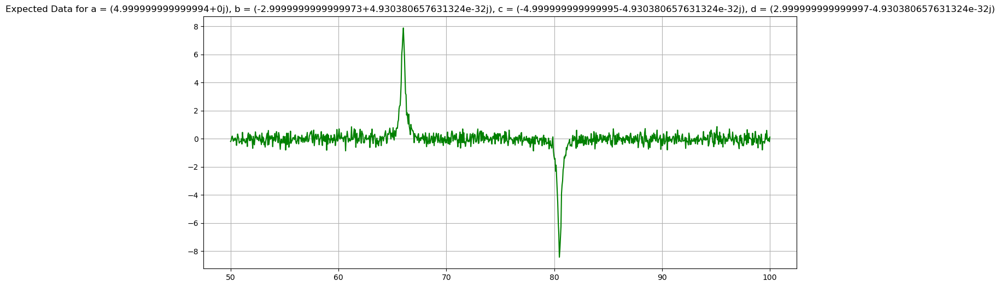

In [58]:
expected_data(*np.diag(dj_p2_u0))

In [59]:

dj_p0_u1 = apply_ops([P0, HH, U1, HH], matrix=thermal_matrix) 
a2l(dj_p0_u1)



<IPython.core.display.Latex object>

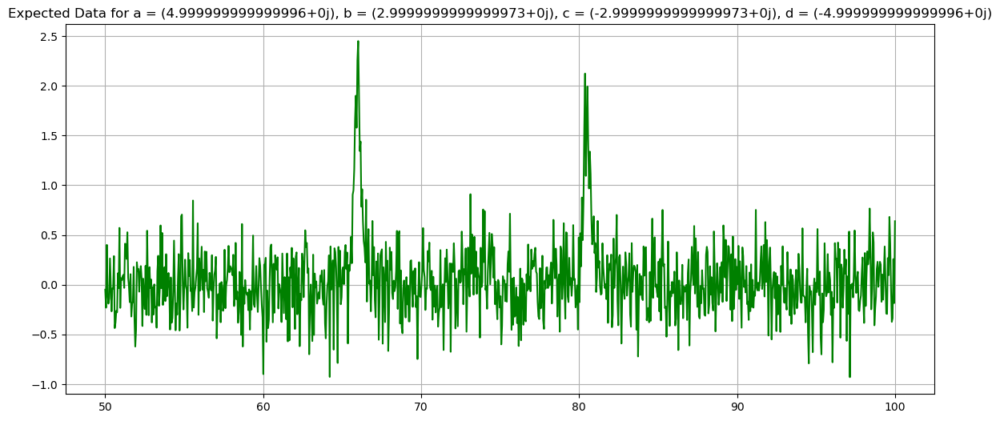

In [60]:
expected_data(*np.diag(dj_p0_u1))

In [61]:
dj_p1_u1 = apply_ops([P1, HH, U1, HH], matrix=thermal_matrix)
a2l(dj_p1_u1)

<IPython.core.display.Latex object>

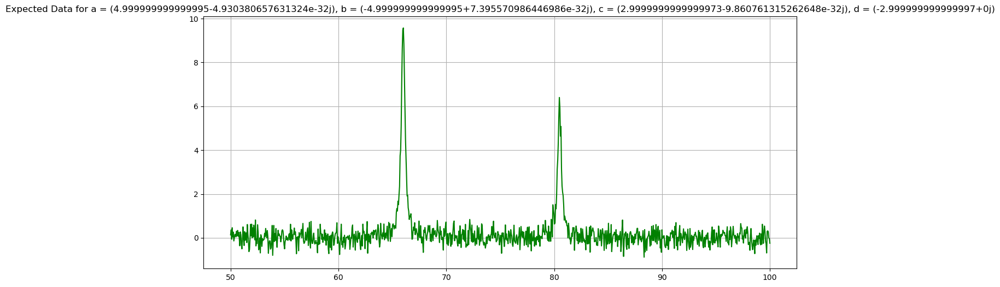

In [62]:
expected_data(*np.diag(dj_p1_u1))

In [63]:
dj_p2_u1 = apply_ops([P2, HH, U1, HH], matrix=thermal_matrix)
a2l(dj_p2_u1)

<IPython.core.display.Latex object>

/home/amanmehta/tools/anaconda3/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


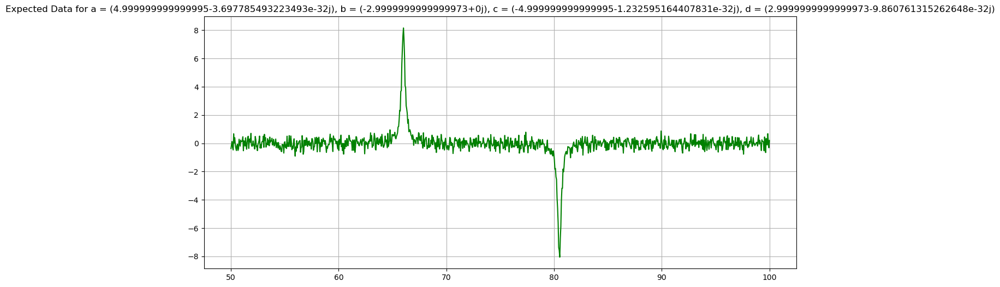

In [64]:
expected_data(*np.diag(dj_p2_u1))

In [109]:
dj_p0_u2 = apply_ops([P0, HH, U2, HH])

print(U2@HH@P0@thermal_matrix@np.conjugate(np.transpose(P0))@np.conjugate(np.transpose(HH))@np.conjugate(np.transpose(U2)))
a2l(dj_p0_u2)



[[0.+0.j 1.+0.j 0.+0.j 4.+0.j]
 [1.+0.j 0.+0.j 4.+0.j 0.+0.j]
 [0.+0.j 4.+0.j 0.+0.j 1.+0.j]
 [4.+0.j 0.+0.j 1.+0.j 0.+0.j]]


<IPython.core.display.Latex object>

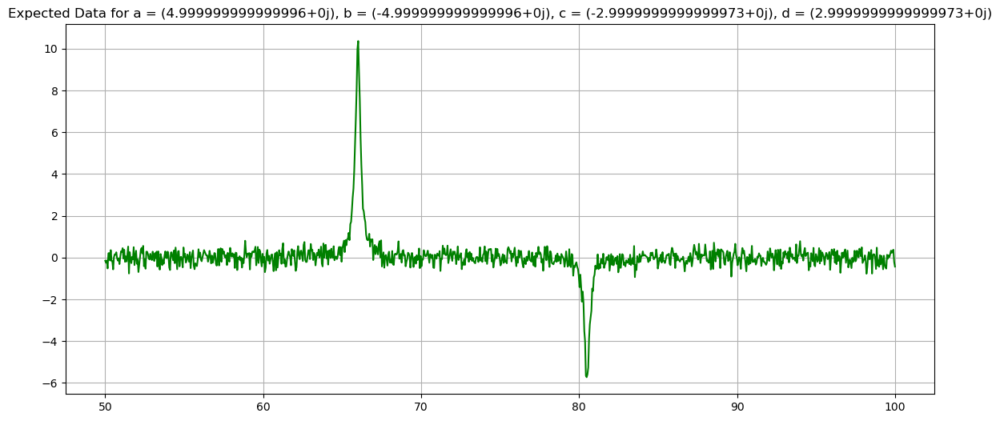

In [66]:
expected_data(*np.diag(dj_p0_u2))

In [105]:
dj_p1_u2 = apply_ops([P1, HH, U2, HH], matrix=thermal_matrix)
a2l(dj_p1_u2)

<IPython.core.display.Latex object>

/home/amanmehta/tools/anaconda3/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


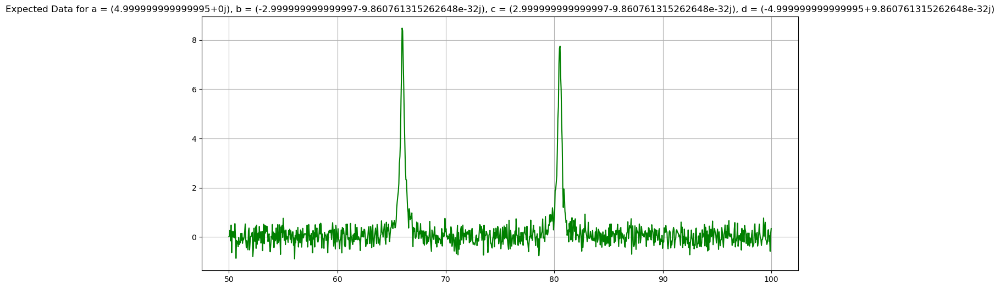

In [106]:

expected_data(*np.diag(dj_p1_u2))

In [107]:
dj_p2_u2 = apply_ops([P2, HH, U2, HH], matrix=thermal_matrix)
a2l(dj_p2_u2)

<IPython.core.display.Latex object>

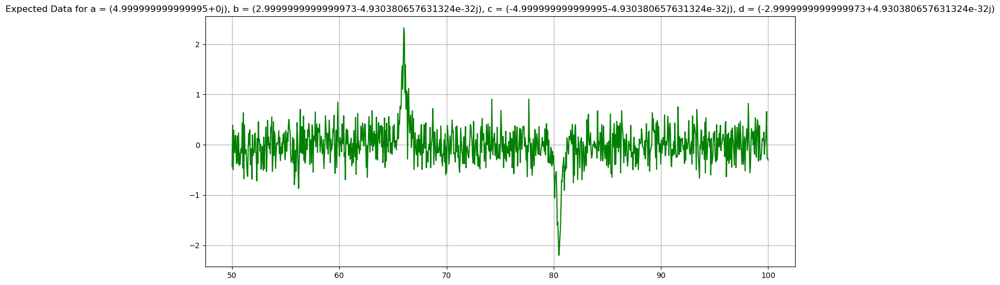

In [108]:
expected_data(*np.diag(dj_p2_u2))

In [121]:
a,b,c,d = [5,3,-3,-5]

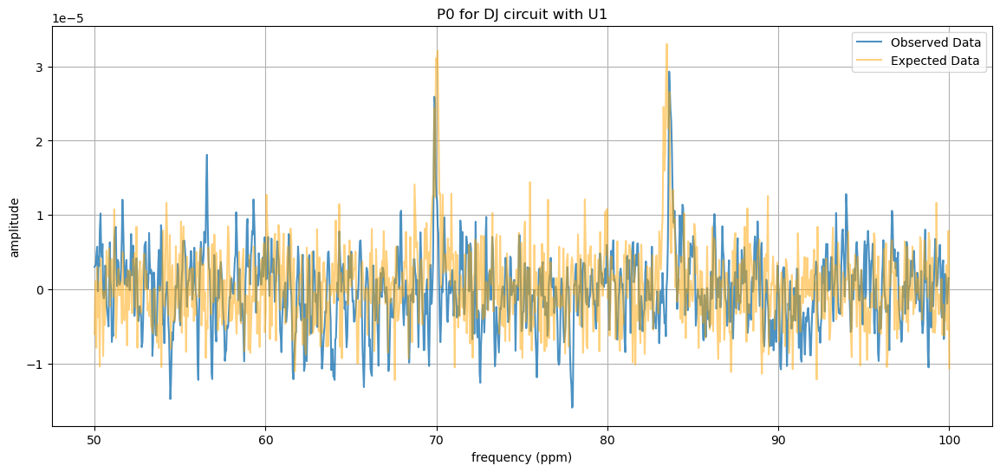

In [127]:
plot_data_and_expected('../lab_data/lab4/lab4_DJ_P0_U1.csv', "frequency (ppm)", "amplitude", "P0 for DJ circuit with U1", a,b,c,d )

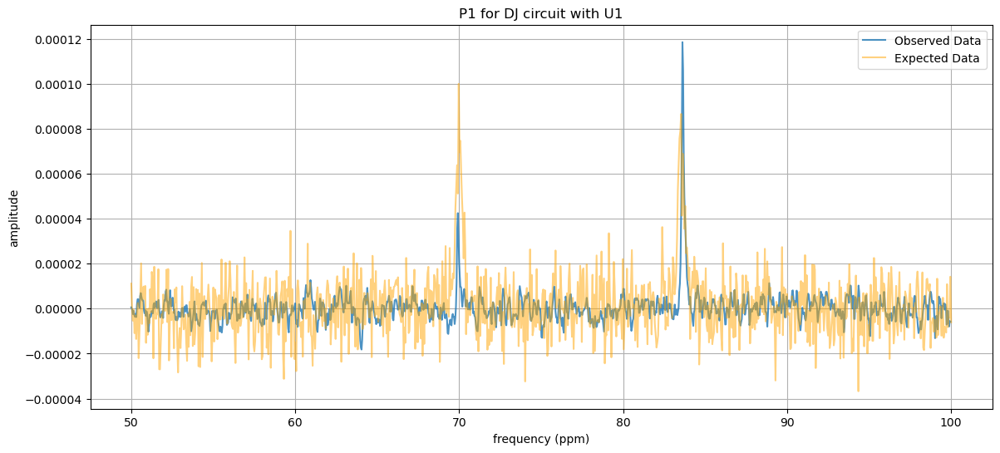

In [130]:
plot_data_and_expected('../lab_data/lab4/lab4_DJ_P1_U1.csv', "frequency (ppm)", "amplitude", "P1 for DJ circuit with U1", a,b,c,d )

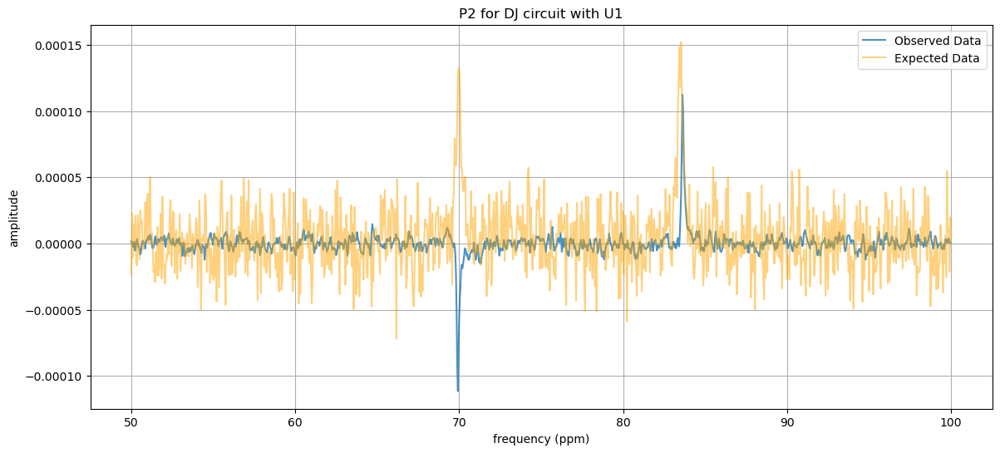

In [131]:
plot_data_and_expected('../lab_data/lab4/lab4_DJ_P2_U1.csv', "frequency (ppm)", "amplitude", "P2 for DJ circuit with U1", a,b,c,d )

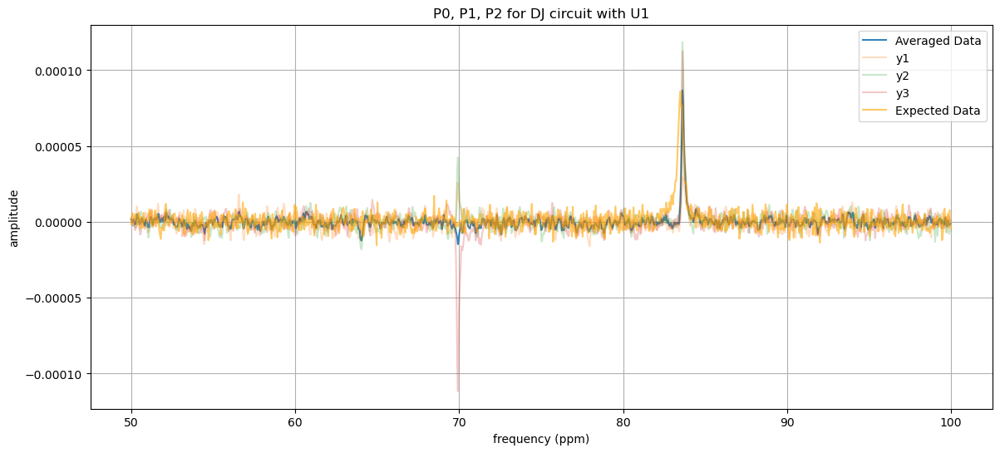

In [215]:
plot_data_with_offset('../lab_data/lab4/lab4_DJ_P0_U1.csv', '../lab_data/lab4/lab4_DJ_P1_U1.csv', '../lab_data/lab4/lab4_DJ_P2_U1.csv', "frequency (ppm)", "amplitude", "P0, P1, P2 for DJ circuit with U1", a=0,b=0,c=0,d=d )

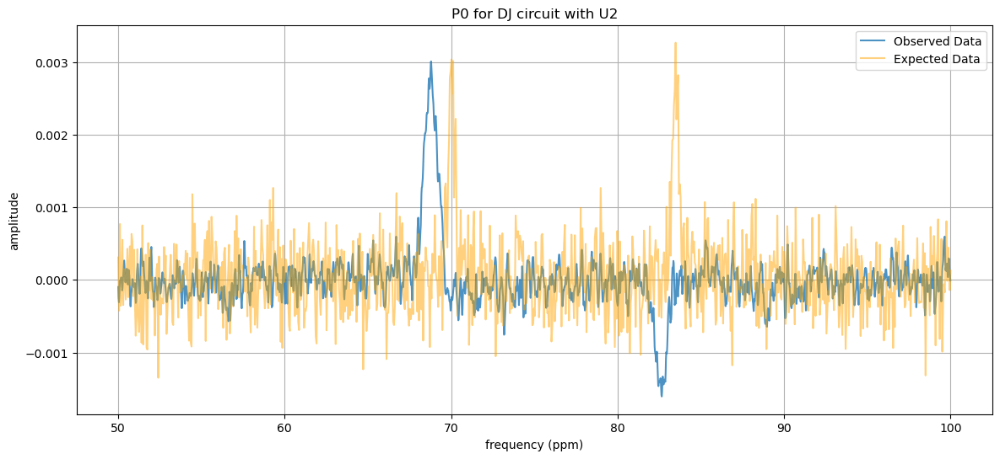

In [141]:
plot_data_and_expected('../lab_data/lab4/lab4_DJ_P0_U2.csv', "frequency (ppm)", "amplitude", "P0 for DJ circuit with U2", a,b,c,d )

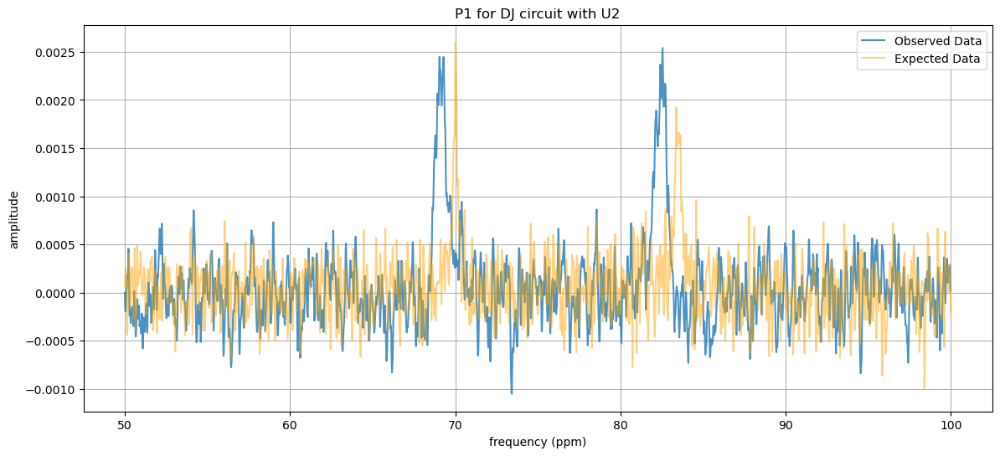

In [142]:
plot_data_and_expected('../lab_data/lab4/lab4_DJ_P1_U2.csv', "frequency (ppm)", "amplitude", "P1 for DJ circuit with U2", a,b,c,d )

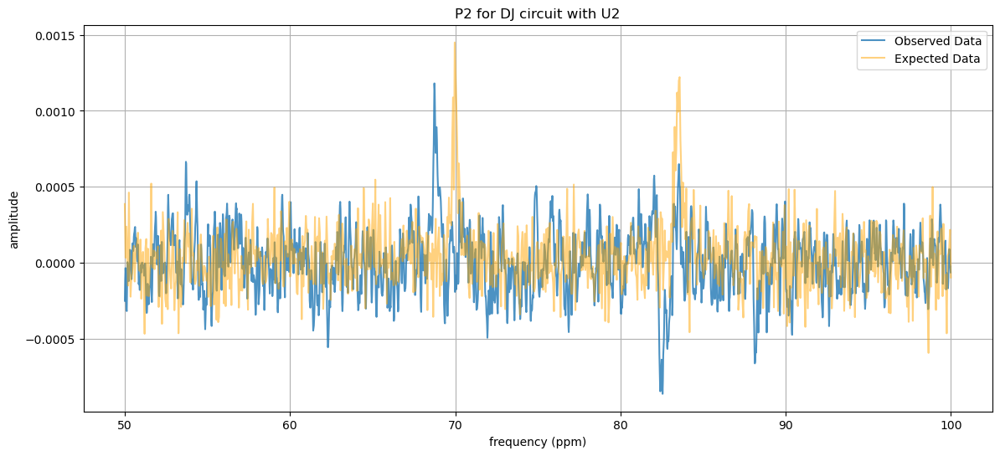

In [143]:
plot_data_and_expected('../lab_data/lab4/lab4_DJ_P2_U2.csv', "frequency (ppm)", "amplitude", "P2 for DJ circuit with U2", a,b,c,d )

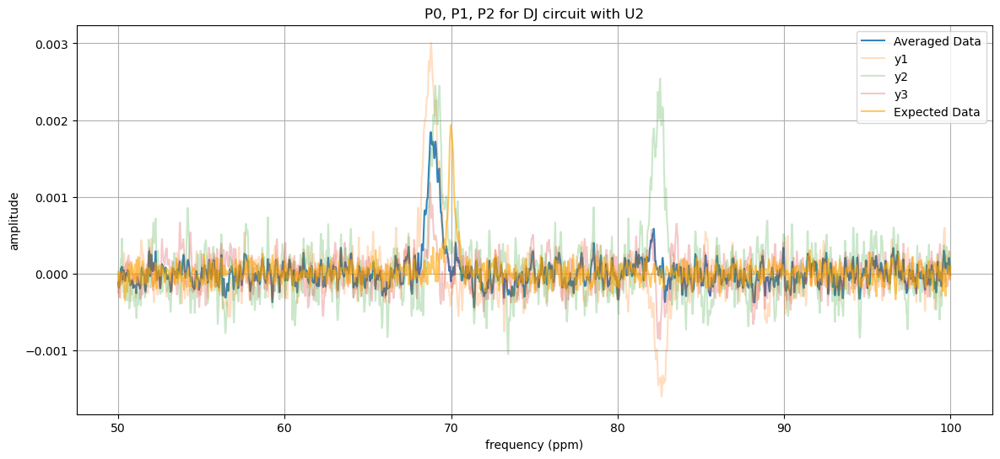

In [216]:
plot_data_with_offset('../lab_data/lab4/lab4_DJ_P0_U2.csv', '../lab_data/lab4/lab4_DJ_P1_U2.csv', '../lab_data/lab4/lab4_DJ_P2_U2.csv', "frequency (ppm)", "amplitude", "P0, P1, P2 for DJ circuit with U2", a=a,b=0,c=0,d=0 )

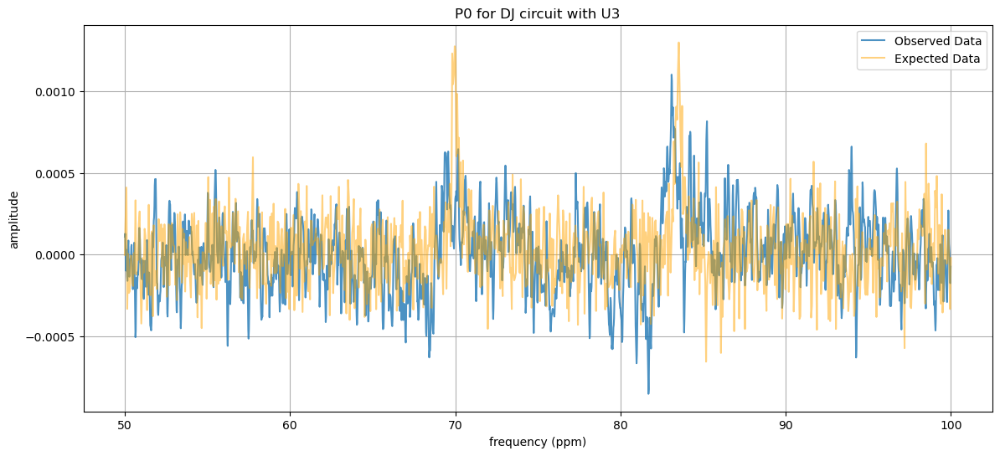

In [145]:
plot_data_and_expected('../lab_data/lab4/lab4_DJ_P0_U3.csv', "frequency (ppm)", "amplitude", "P0 for DJ circuit with U3", a,b,c,d )

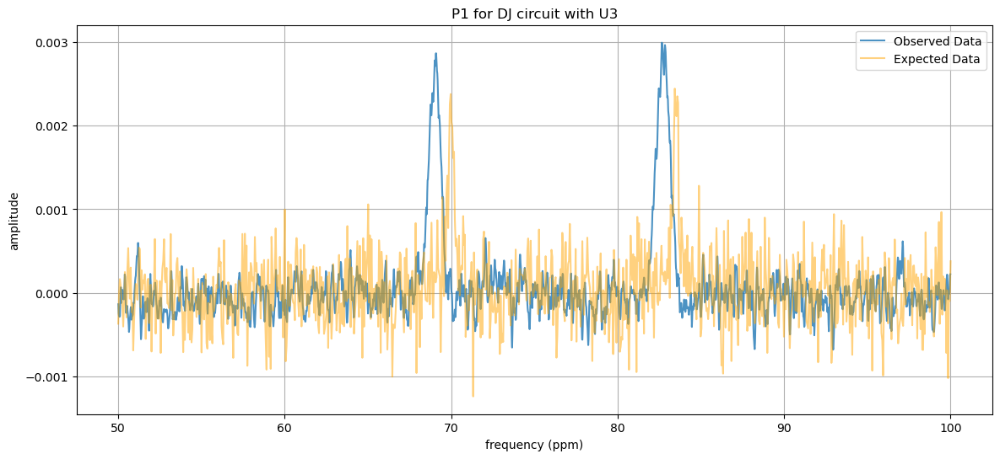

In [146]:
plot_data_and_expected('../lab_data/lab4/lab4_DJ_P1_U3.csv', "frequency (ppm)", "amplitude", "P1 for DJ circuit with U3", a,b,c,d )

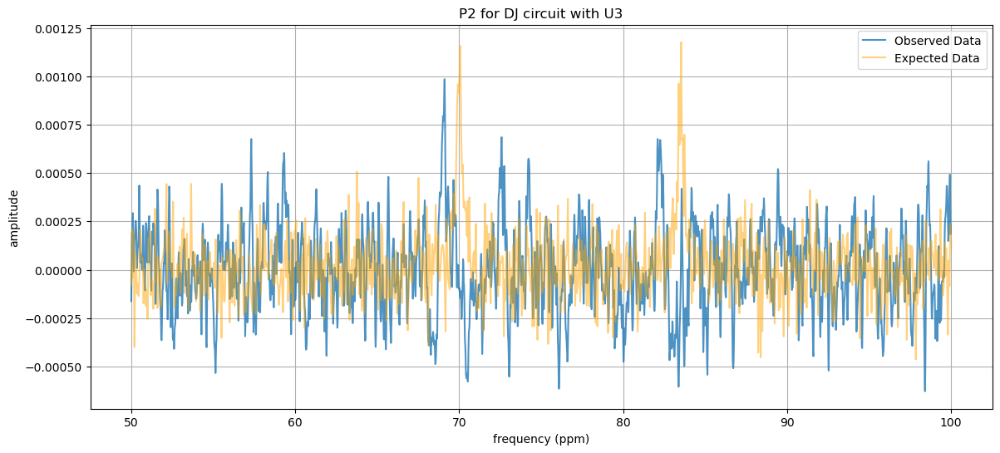

In [147]:
plot_data_and_expected('../lab_data/lab4/lab4_DJ_P2_U3.csv', "frequency (ppm)", "amplitude", "P2 for DJ circuit with U3", a,b,c,d )

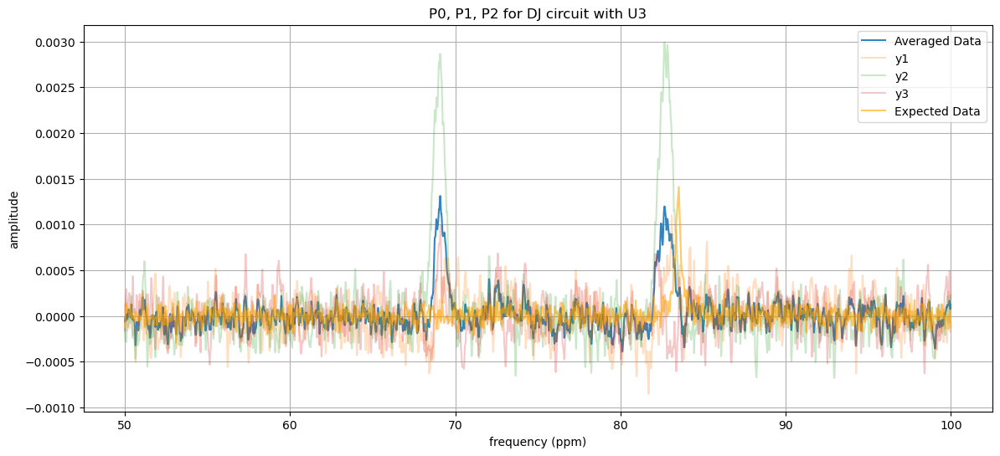

In [217]:
plot_data_with_offset('../lab_data/lab4/lab4_DJ_P0_U3.csv', '../lab_data/lab4/lab4_DJ_P1_U3.csv', '../lab_data/lab4/lab4_DJ_P2_U3.csv', "frequency (ppm)", "amplitude", "P0, P1, P2 for DJ circuit with U3", a=0,b=0,c=0,d=d )

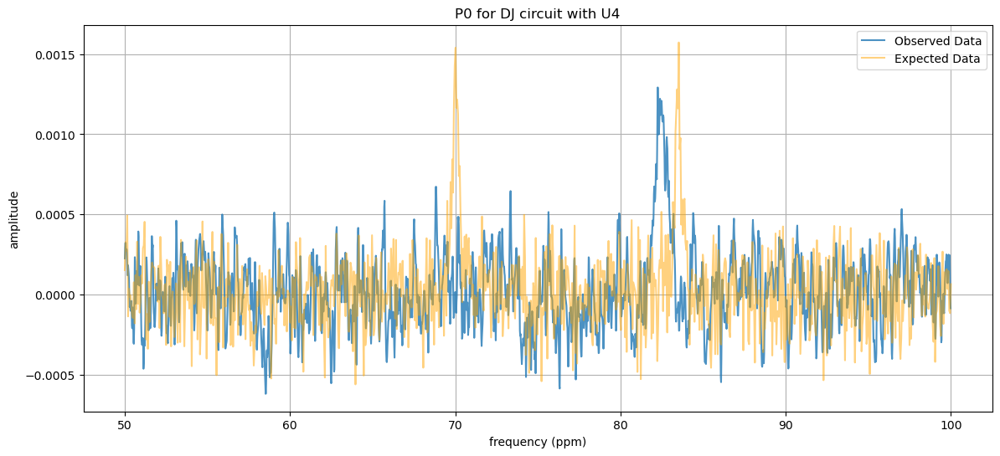

In [149]:
plot_data_and_expected('../lab_data/lab4/lab4_DJ_P0_U4.csv', "frequency (ppm)", "amplitude", "P0 for DJ circuit with U4", a,b,c,d )

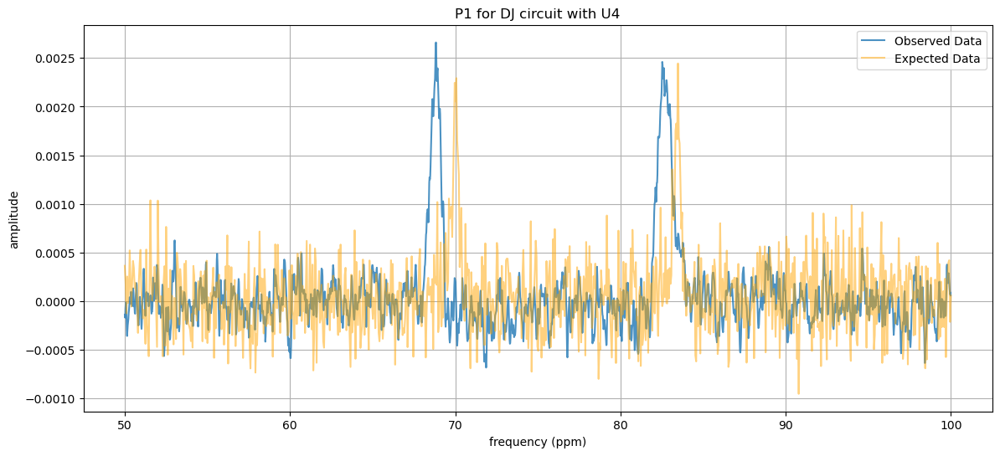

In [150]:
plot_data_and_expected('../lab_data/lab4/lab4_DJ_P1_U4.csv', "frequency (ppm)", "amplitude", "P1 for DJ circuit with U4", a,b,c,d )

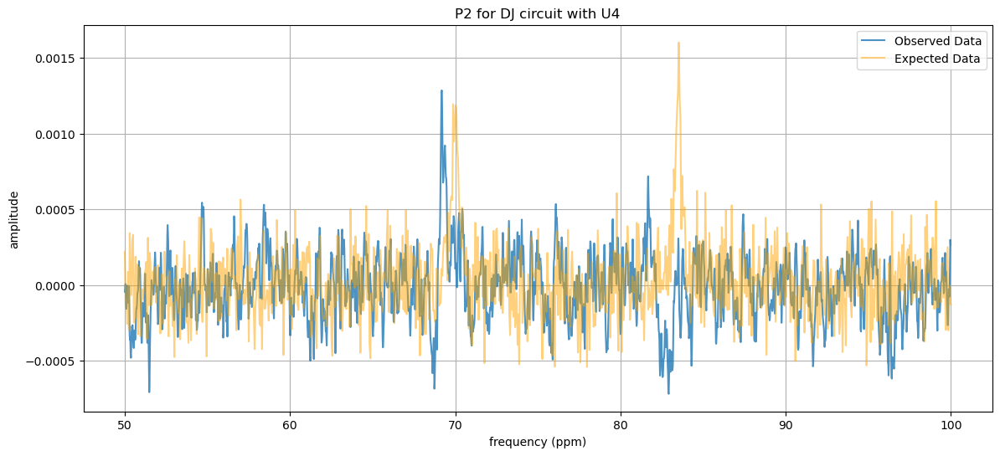

In [151]:
plot_data_and_expected('../lab_data/lab4/lab4_DJ_P2_U4.csv', "frequency (ppm)", "amplitude", "P2 for DJ circuit with U4", a,b,c,d )

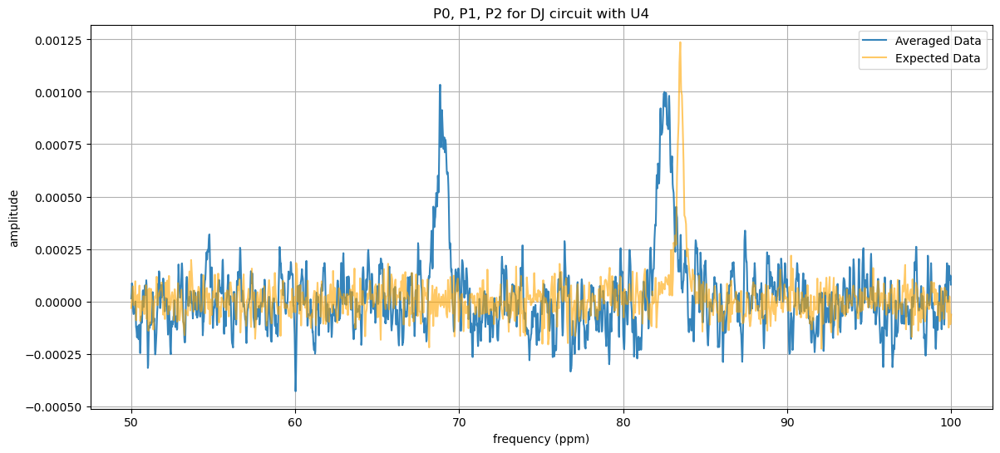

In [152]:
plot_data_with_offset('../lab_data/lab4/lab4_DJ_P0_U4.csv', '../lab_data/lab4/lab4_DJ_P1_U4.csv', '../lab_data/lab4/lab4_DJ_P2_U4.csv', "frequency (ppm)", "amplitude", "P0, P1, P2 for DJ circuit with U4", a=0,b=0,c=0,d=d )

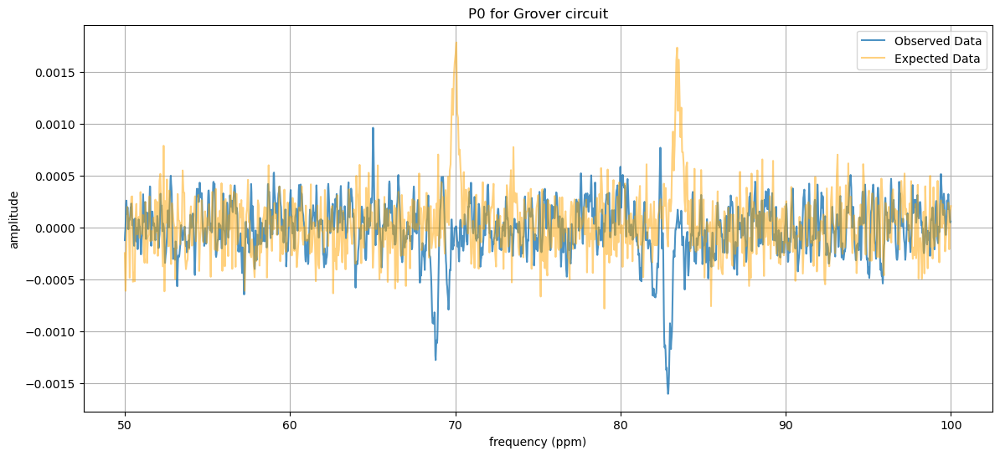

In [154]:
plot_data_and_expected('../lab_data/lab4/Grover/lab4_grover_P0.csv', "frequency (ppm)", "amplitude", "P0 for Grover circuit", a,b,c,d )

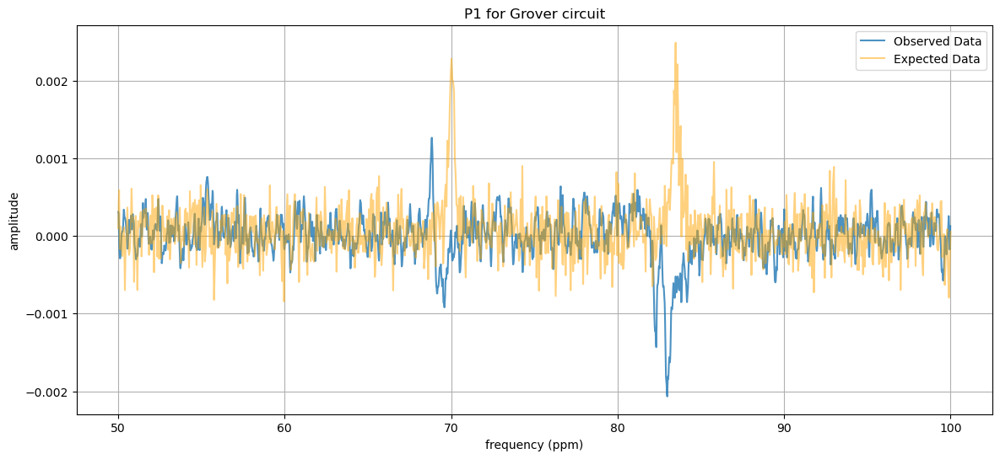

In [155]:
plot_data_and_expected('../lab_data/lab4/Grover/lab4_grover_P1.csv', "frequency (ppm)", "amplitude", "P1 for Grover circuit", a,b,c,d )

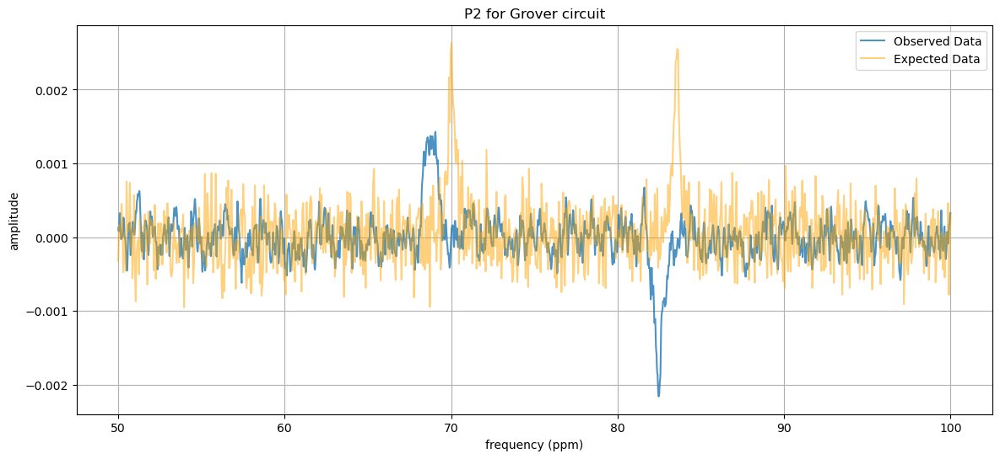

In [156]:
plot_data_and_expected('../lab_data/lab4/Grover/lab4_grover_P2.csv', "frequency (ppm)", "amplitude", "P2 for Grover circuit", a,b,c,d )

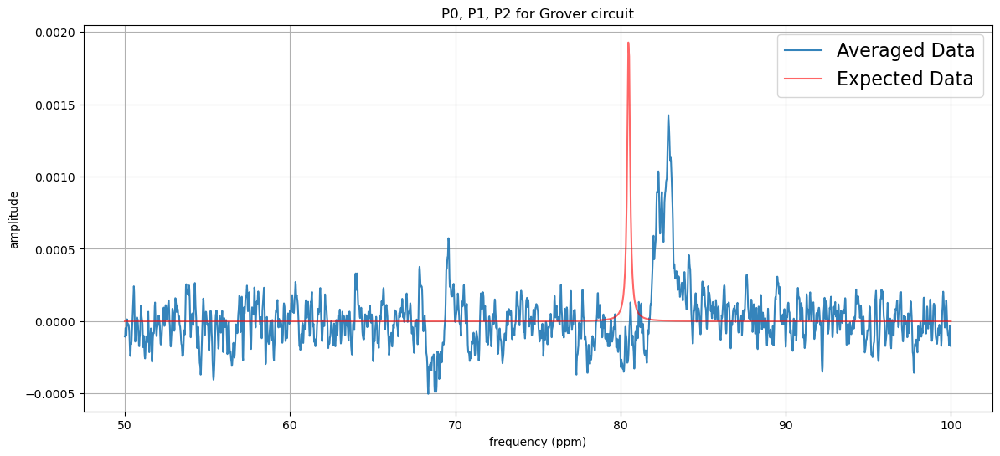

In [308]:
plot_data_with_offset('../lab_data/lab4/Grover/lab4_grover_P0.csv', '../lab_data/lab4/Grover/lab4_grover_P1.csv', '../lab_data/lab4/Grover/lab4_grover_P2.csv', "frequency (ppm)", "amplitude", "P0, P1, P2 for Grover circuit", a=0,b=0,c=0,d=d , flip1=True, flip2=True, flip3=True)

# day 2 data

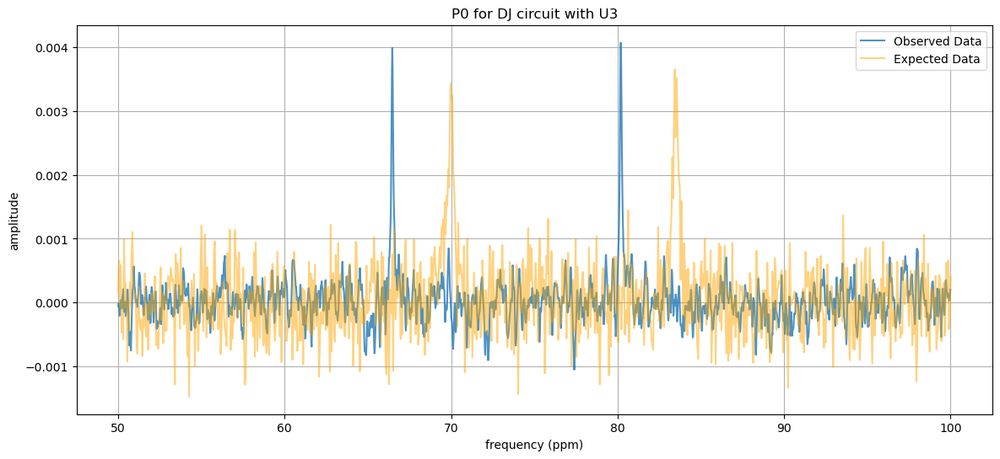

In [158]:
plot_data_and_expected("../lab_data/lab4//lab4_2/dj_u3_p0.csv", "frequency (ppm)", "amplitude", "P0 for DJ circuit with U3", a,b,c,d )

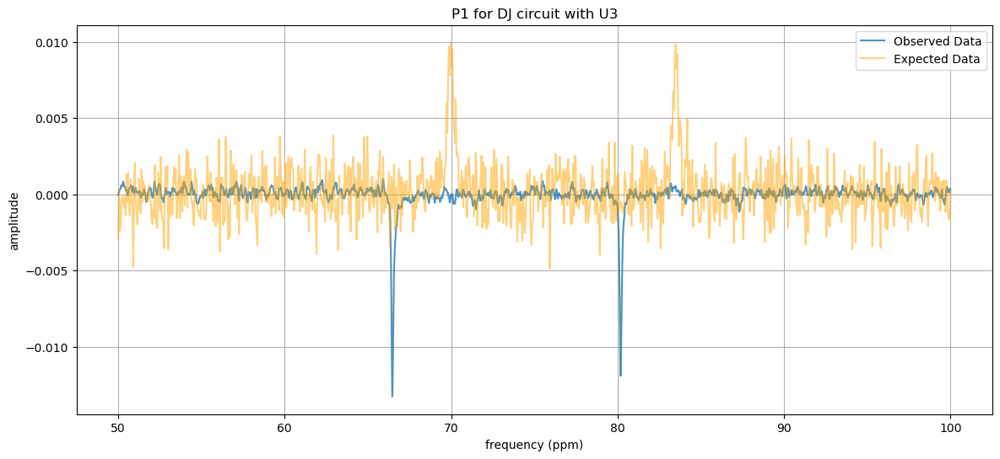

In [159]:
plot_data_and_expected("../lab_data/lab4//lab4_2/dj_u3_p1.csv", "frequency (ppm)", "amplitude", "P1 for DJ circuit with U3", a,b,c,d )

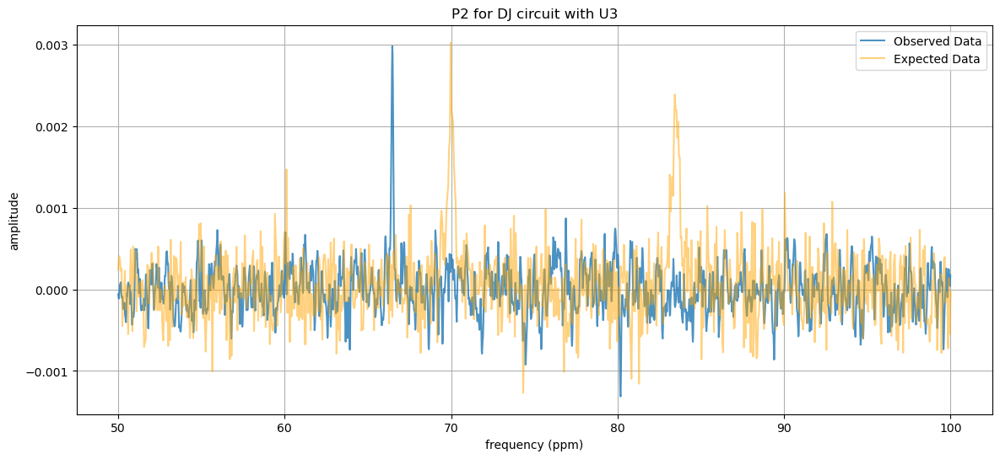

In [160]:
plot_data_and_expected("../lab_data/lab4/lab4_2/dj_u3_p2.csv", "frequency (ppm)", "amplitude", "P2 for DJ circuit with U3", a,b,c,d )

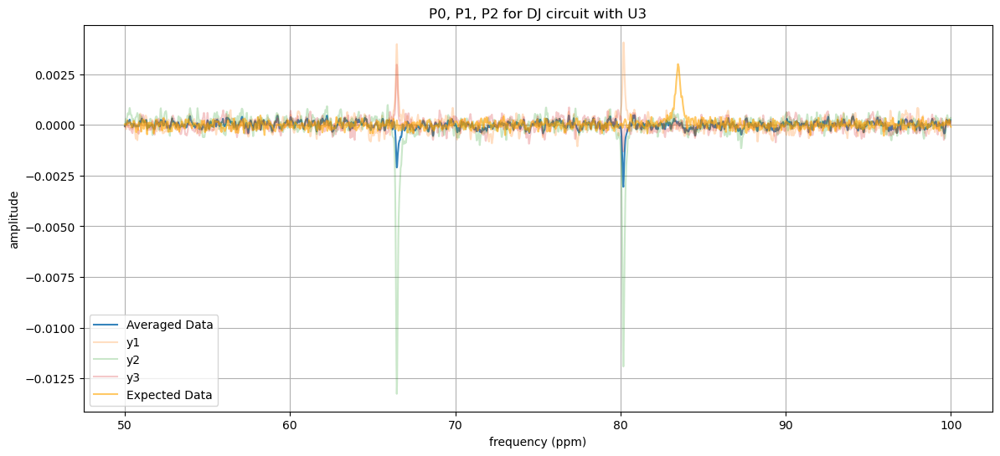

In [196]:
plot_data_with_offset("../lab_data/lab4/lab4_2/dj_u3_p0.csv", "../lab_data/lab4/lab4_2/dj_u3_p1.csv", "../lab_data/lab4/lab4_2/dj_u3_p2.csv", "frequency (ppm)", "amplitude", "P0, P1, P2 for DJ circuit with U3", a=0,b=0,c=0,d=d )

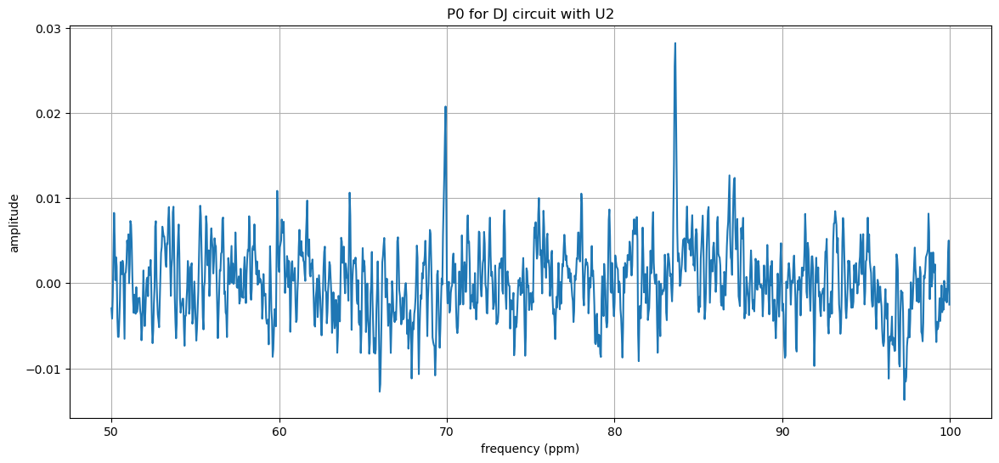

In [252]:
plot_data("../lab_data/lab4/dj/g2_dj_u3_p0.csv", "frequency (ppm)", "amplitude", "P0 for DJ circuit with U2" )

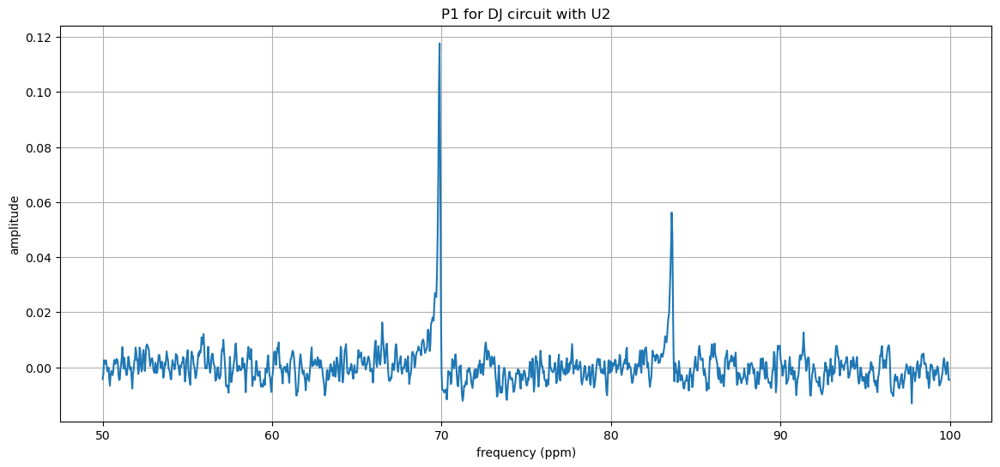

In [253]:
plot_data("../lab_data/lab4/dj/g2_dj_u3_p1.csv", "frequency (ppm)", "amplitude", "P1 for DJ circuit with U2")

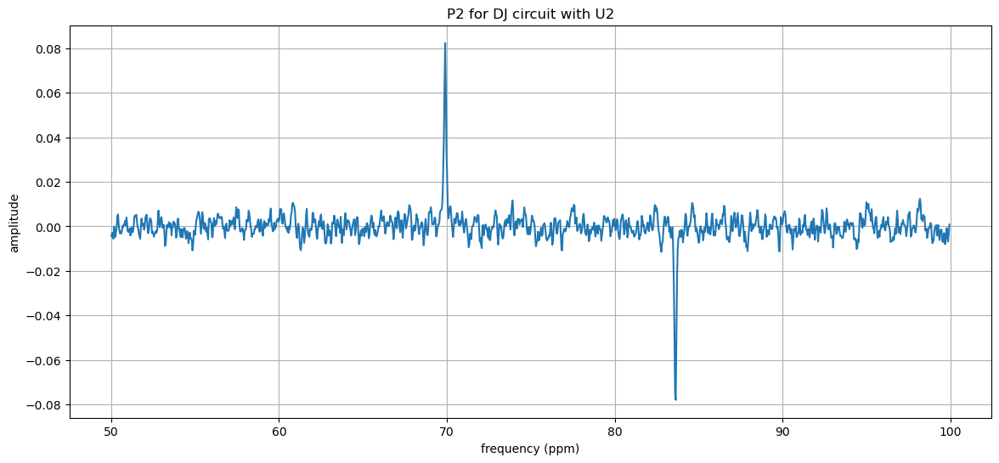

In [254]:
plot_data("../lab_data/lab4/dj/g2_dj_u3_p2.csv", "frequency (ppm)", "amplitude", "P2 for DJ circuit with U2" )

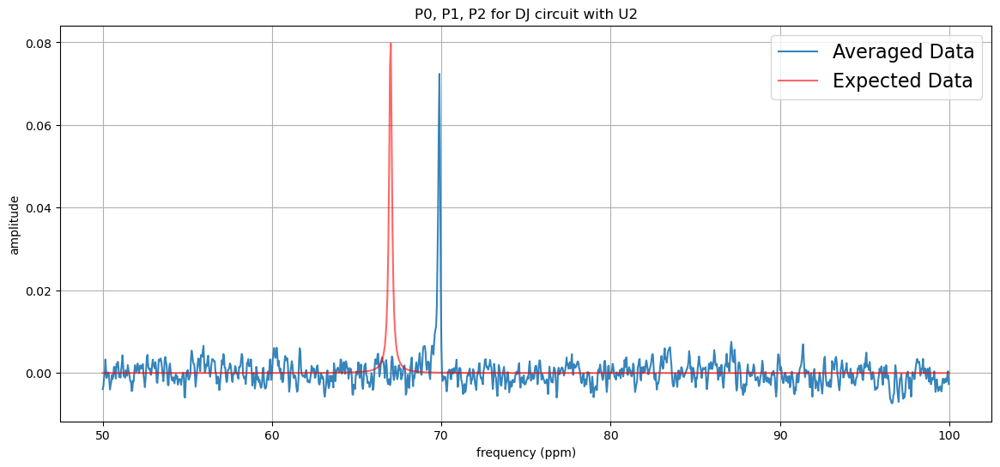

In [296]:
plot_data_with_offset("../lab_data/lab4/dj/g2_dj_u3_p0.csv", "../lab_data/lab4/dj/g2_dj_u3_p1.csv", "../lab_data/lab4/dj/g2_dj_u3_p2.csv", "frequency (ppm)", "amplitude", "P0, P1, P2 for DJ circuit with U2", a=a,b=0,c=0,d=0 , offset1=True, offset2=True, offset3=True)

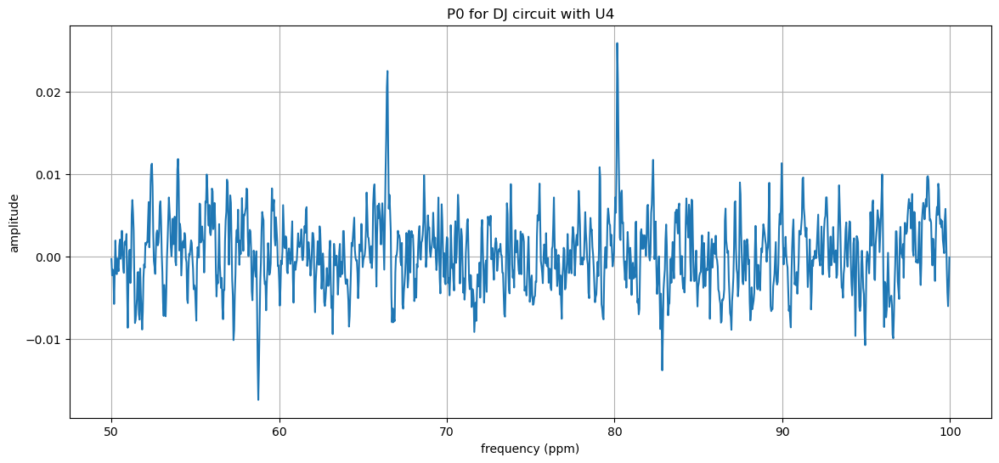

In [267]:
plot_data("../lab_data/lab4/dj/g2_dj_u4_p0.csv", "frequency (ppm)", "amplitude", "P0 for DJ circuit with U4")

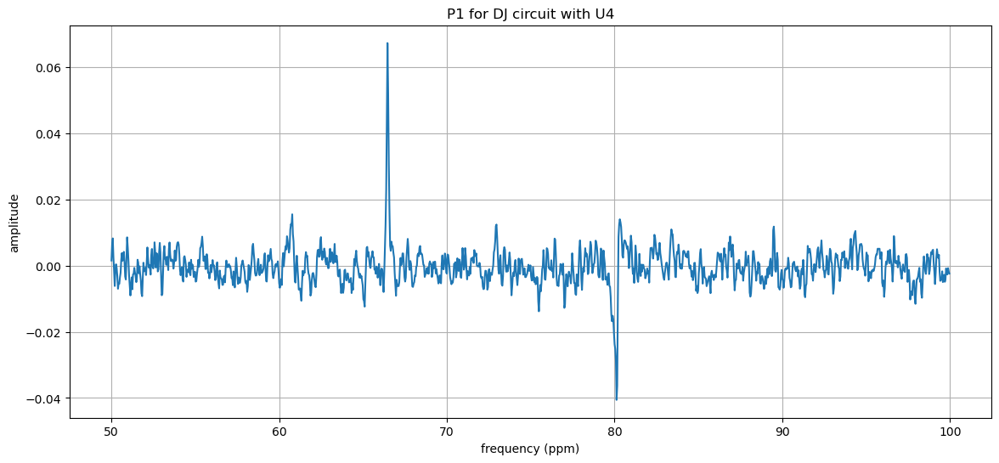

In [262]:
plot_data("../lab_data/lab4/dj/g2_dj_u4_p1.csv", "frequency (ppm)", "amplitude", "P1 for DJ circuit with U4")

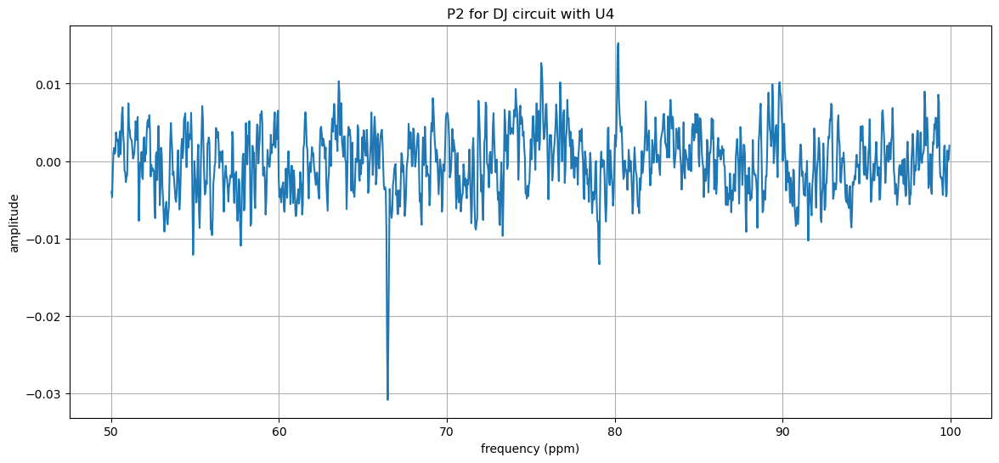

In [263]:
plot_data("../lab_data/lab4/dj/g2_dj_u4_p2.csv", "frequency (ppm)", "amplitude", "P2 for DJ circuit with U4" )

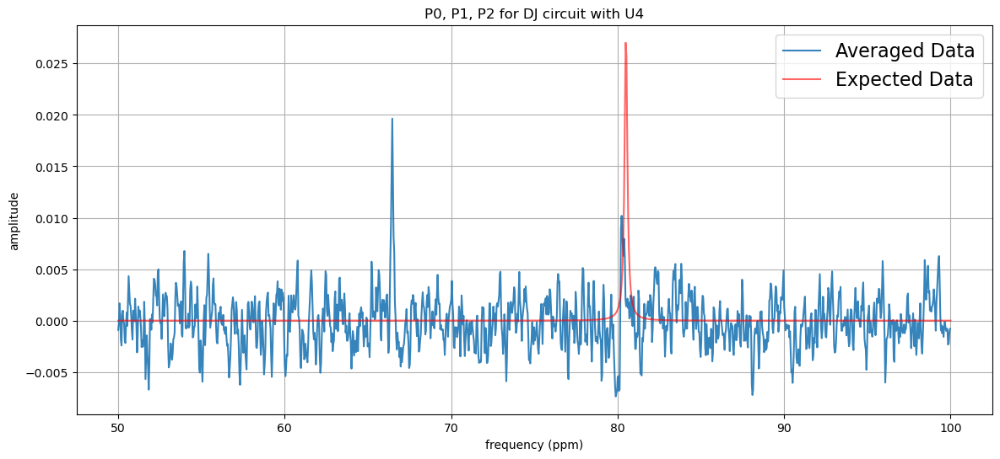

In [285]:
plot_data_with_offset("../lab_data/lab4/dj/g2_dj_u4_p0.csv", "../lab_data/lab4/dj/g2_dj_u4_p1.csv", "../lab_data/lab4/dj/g2_dj_u4_p2.csv", "frequency (ppm)", "amplitude", "P0, P1, P2 for DJ circuit with U4", a=0,b=0,c=0,d=d )

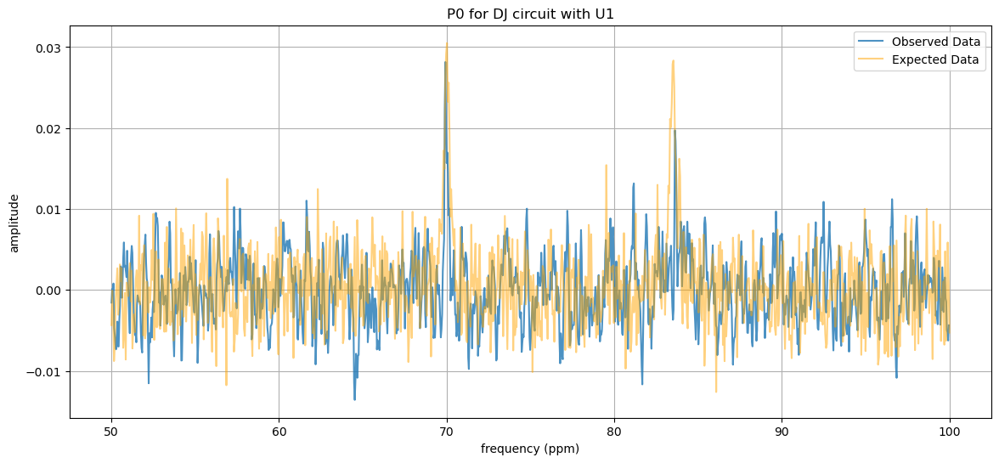

In [172]:
plot_data_and_expected("../lab_data/lab4/dj/g2_dj_u1_p0.csv", "frequency (ppm)", "amplitude", "P0 for DJ circuit with U1", a,b,c,d )

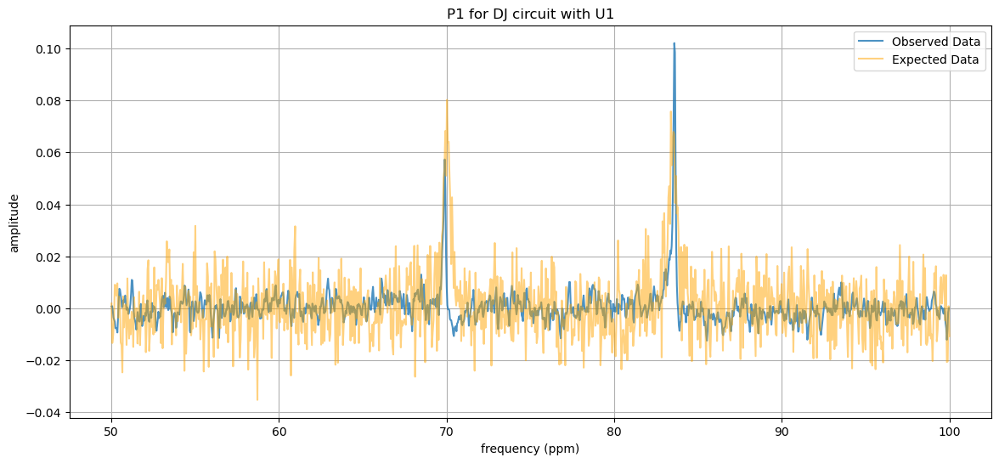

In [173]:
plot_data_and_expected("../lab_data/lab4/dj/g2_dj_u1_p1.csv", "frequency (ppm)", "amplitude", "P1 for DJ circuit with U1", a,b,c,d )

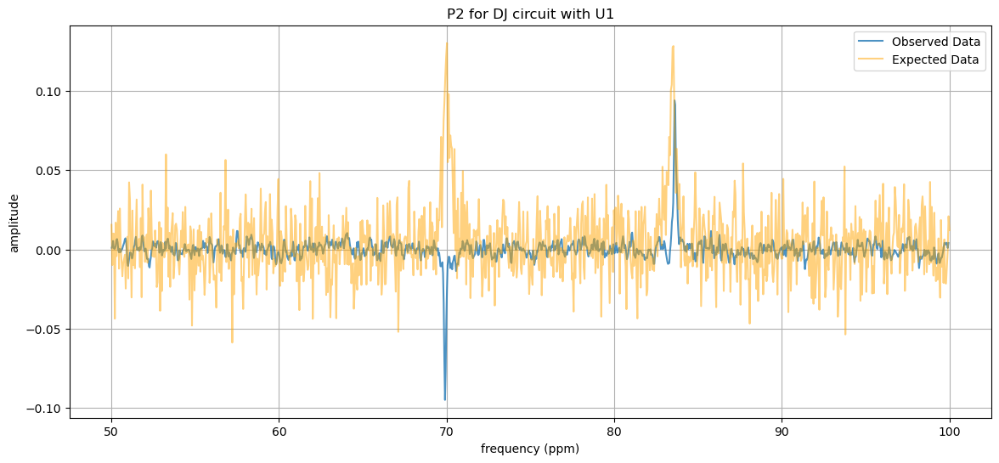

In [174]:
plot_data_and_expected("../lab_data/lab4/dj/g2_dj_u1_p2.csv", "frequency (ppm)", "amplitude", "P2 for DJ circuit with U1", a,b,c,d )

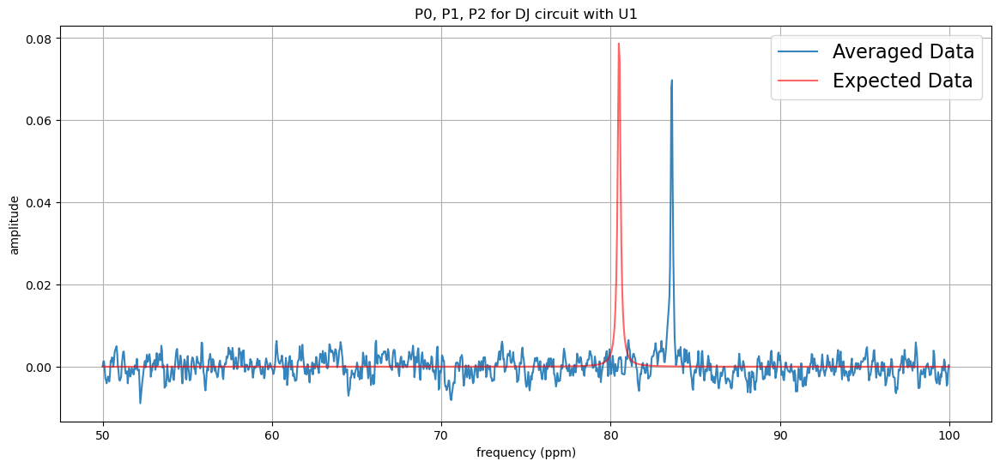

In [297]:
plot_data_with_offset("../lab_data/lab4/dj/g2_dj_u1_p0.csv", "../lab_data/lab4/dj/g2_dj_u1_p1.csv", "../lab_data/lab4/dj/g2_dj_u1_p2.csv", "frequency (ppm)", "amplitude", "P0, P1, P2 for DJ circuit with U1", a=0,b=0,c=0,d=d )

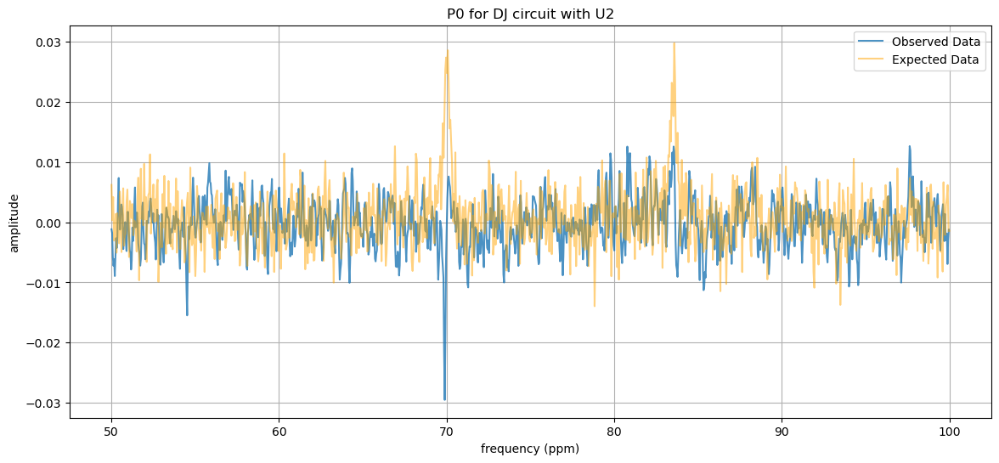

In [176]:
plot_data_and_expected("../lab_data/lab4/dj/g2_dj_u2_p0.csv", "frequency (ppm)", "amplitude", "P0 for DJ circuit with U2", a,b,c,d )

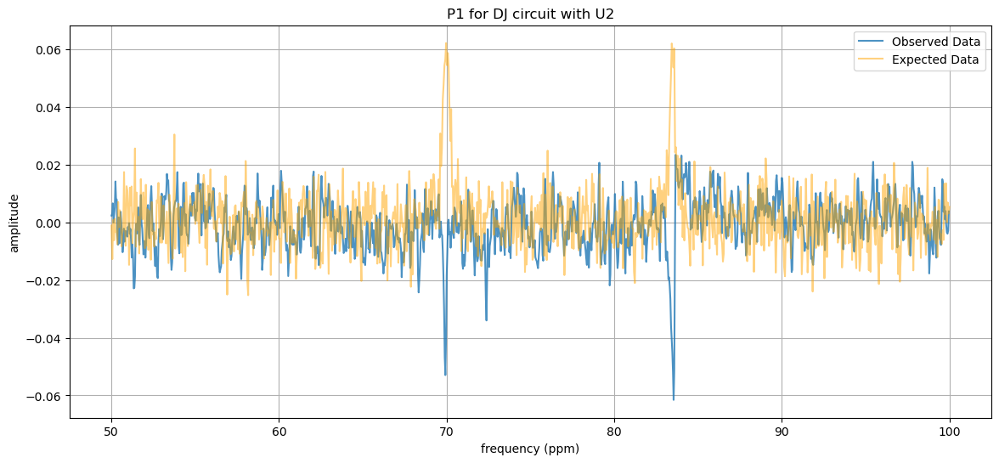

In [177]:
plot_data_and_expected("../lab_data/lab4/dj/g2_dj_u2_p1.csv", "frequency (ppm)", "amplitude", "P1 for DJ circuit with U2", a,b,c,d )

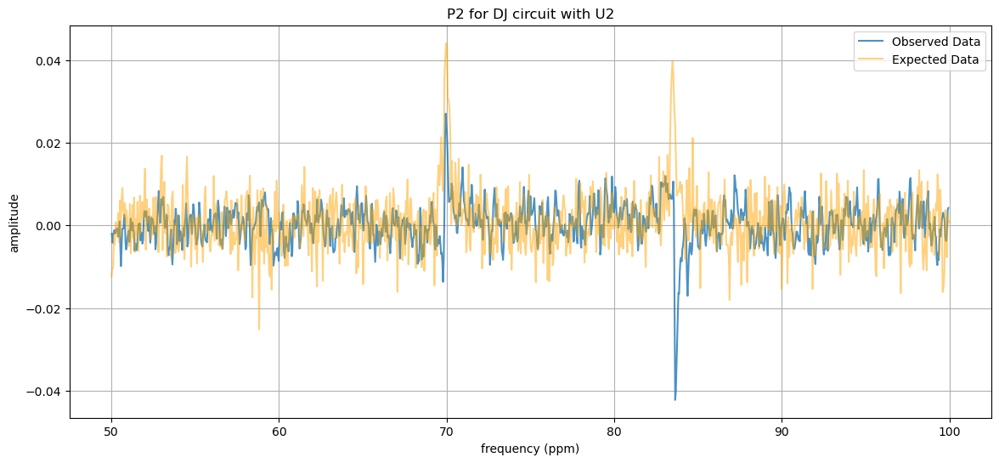

In [178]:
plot_data_and_expected("../lab_data/lab4/dj/g2_dj_u2_p2.csv", "frequency (ppm)", "amplitude", "P2 for DJ circuit with U2", a,b,c,d )

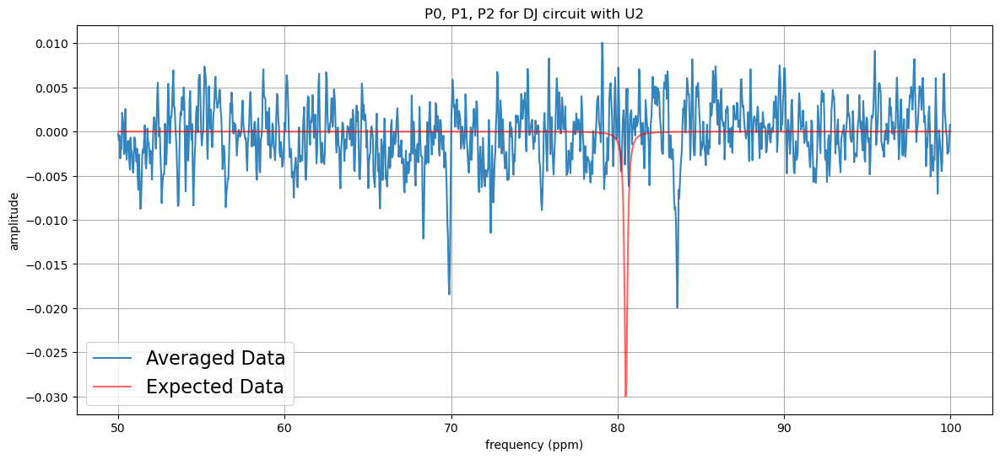

In [299]:
plot_data_with_offset("../lab_data/lab4/dj/g2_dj_u2_p0.csv", "../lab_data/lab4/dj/g2_dj_u2_p1.csv", "../lab_data/lab4/dj/g2_dj_u2_p2.csv", "frequency (ppm)", "amplitude", "P0, P1, P2 for DJ circuit with U2", a=0,b=0,c=0,d=-d )

In [ ]:
plot_data_and_expected("../lab_data/lab4/gr/", "frequency (ppm)", "amplitude", "P0 for Grover circuit 1 iterations", a,b,c,d )

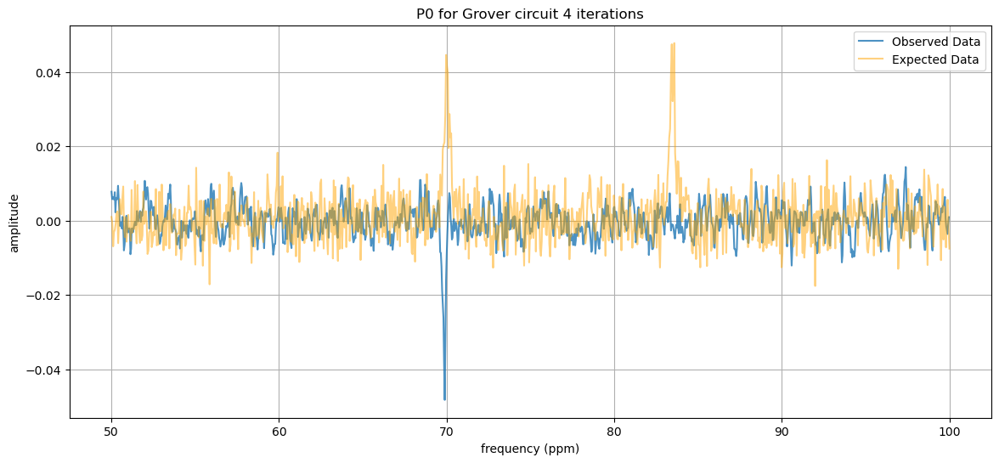

In [188]:
plot_data_and_expected("../lab_data/lab4/gr/g2_gr4_p0.csv", "frequency (ppm)", "amplitude", "P0 for Grover circuit 4 iterations", a,b,c,d )

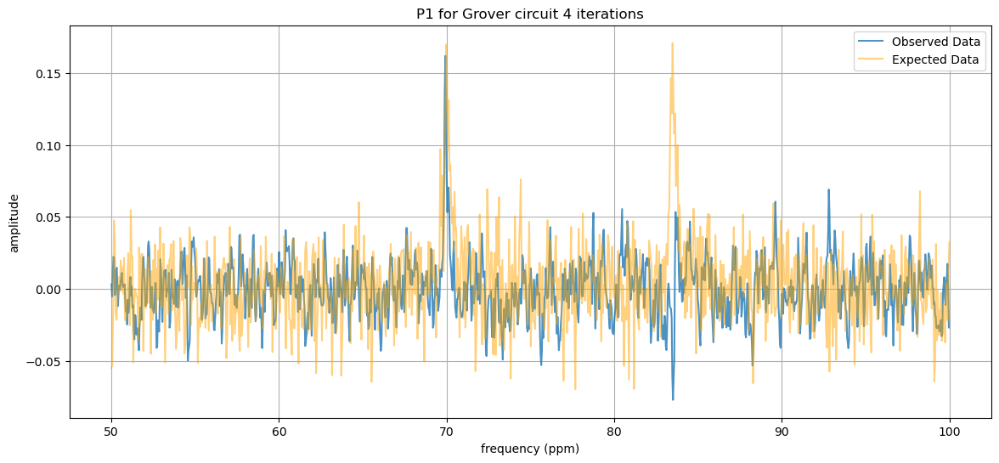

In [189]:
plot_data_and_expected("../lab_data/lab4/gr/g2_gr4_p1.csv", "frequency (ppm)", "amplitude", "P1 for Grover circuit 4 iterations", a,b,c,d )

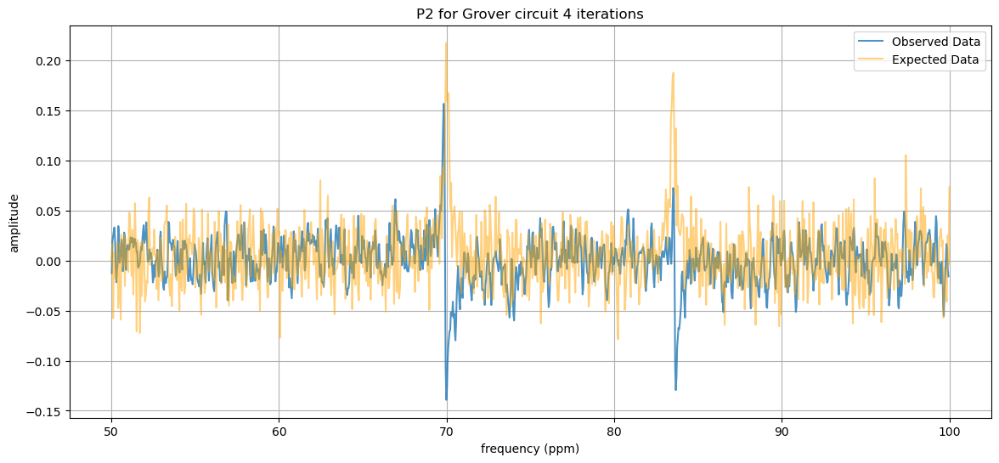

In [190]:
plot_data_and_expected("../lab_data/lab4/gr/g2_gr4_p2.csv", "frequency (ppm)", "amplitude", "P2 for Grover circuit 4 iterations", a,b,c,d )

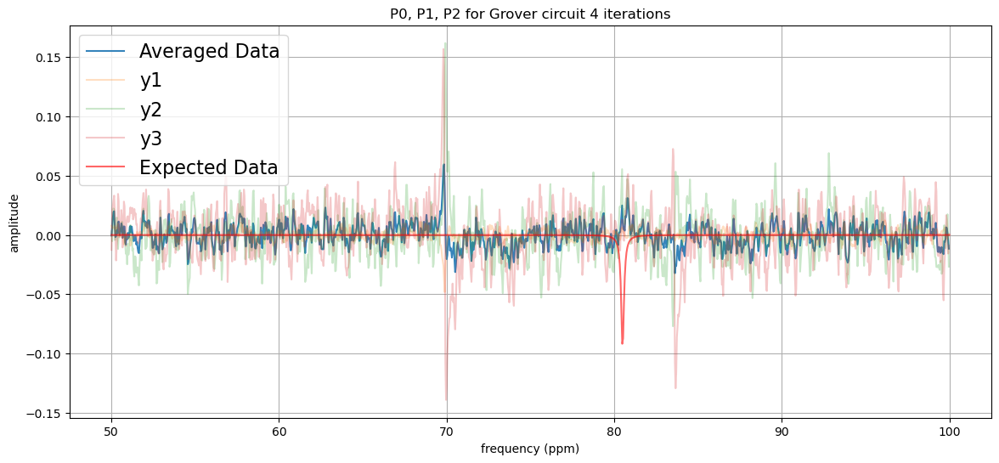

In [328]:
plot_data_with_offset("../lab_data/lab4/gr/g2_gr4_p0.csv", "../lab_data/lab4/gr/g2_gr4_p1.csv", "../lab_data/lab4/gr/g2_gr4_p2.csv", "frequency (ppm)", "amplitude", "P0, P1, P2 for Grover circuit 4 iterations", a=0,b=0,c=0,d=-d )

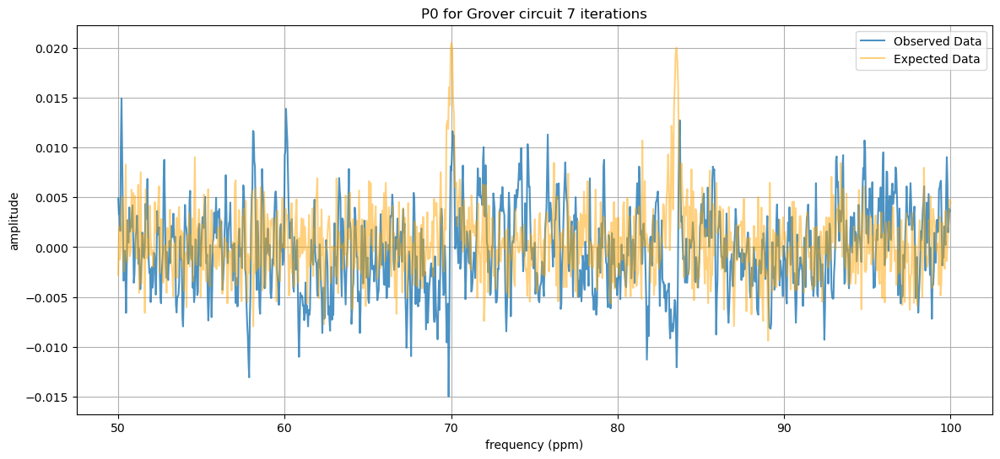

In [201]:
plot_data_and_expected("../lab_data/lab4/gr/g2_gr7_p0.csv", "frequency (ppm)", "amplitude", "P0 for Grover circuit 7 iterations", a,b,c,d )

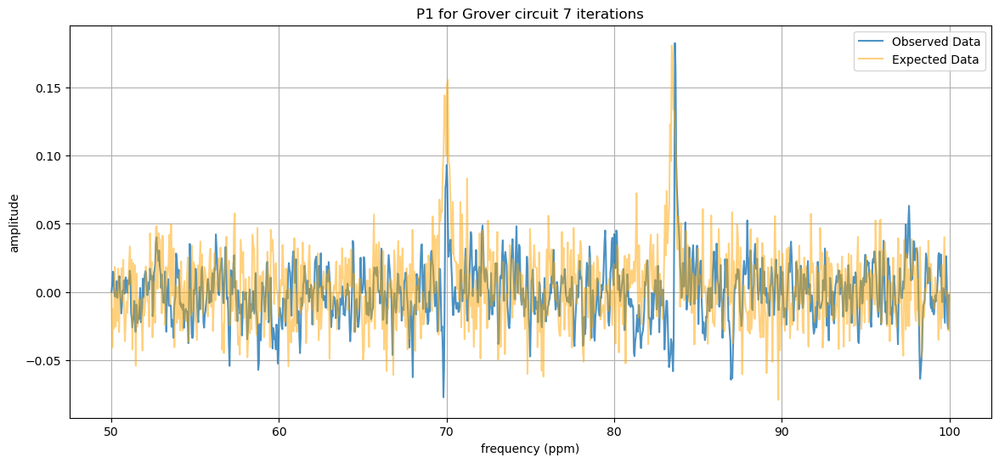

In [202]:
plot_data_and_expected("../lab_data/lab4/gr/g2_gr7_p1.csv", "frequency (ppm)", "amplitude", "P1 for Grover circuit 7 iterations", a,b,c,d )

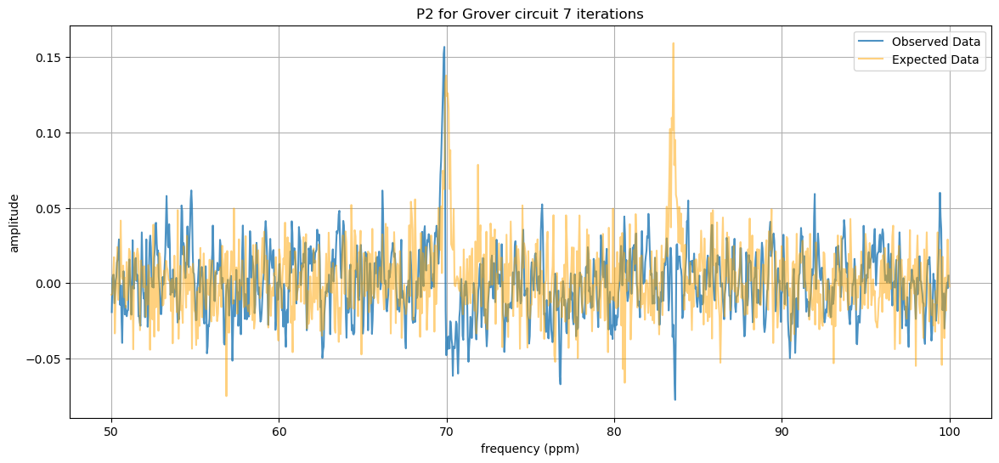

In [203]:
plot_data_and_expected("../lab_data/lab4/gr/g2_gr7_p2.csv", "frequency (ppm)", "amplitude", "P2 for Grover circuit 7 iterations", a,b,c,d )

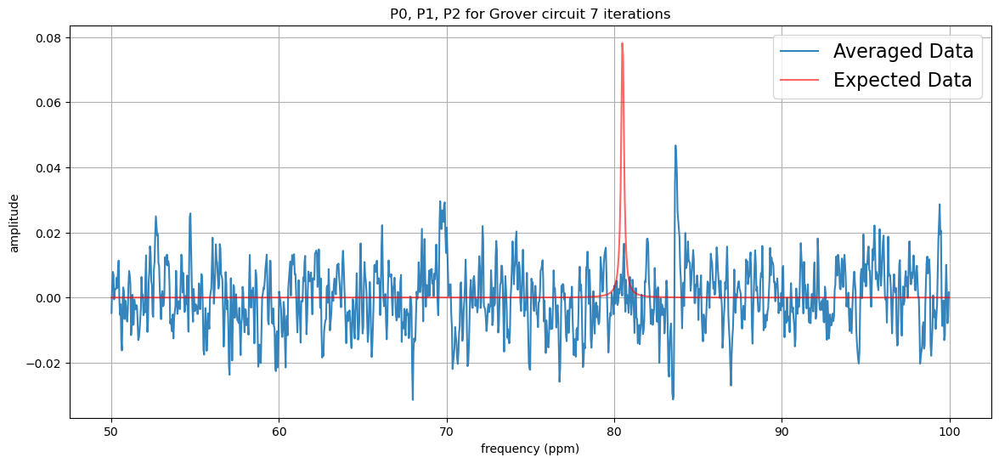

In [314]:
plot_data_with_offset("../lab_data/lab4/gr/g2_gr7_p0.csv", "../lab_data/lab4/gr/g2_gr7_p1.csv", "../lab_data/lab4/gr/g2_gr7_p2.csv", "frequency (ppm)", "amplitude", "P0, P1, P2 for Grover circuit 7 iterations", a=0,b=0,c=0,d=d )

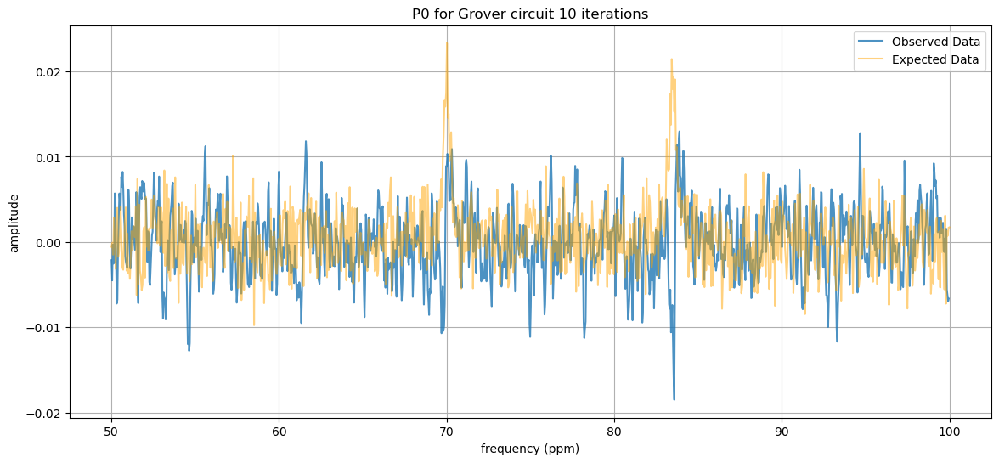

In [205]:
plot_data_and_expected("../lab_data/lab4/gr/g2_gr10_p0.csv", "frequency (ppm)", "amplitude", "P0 for Grover circuit 10 iterations", a,b,c,d )

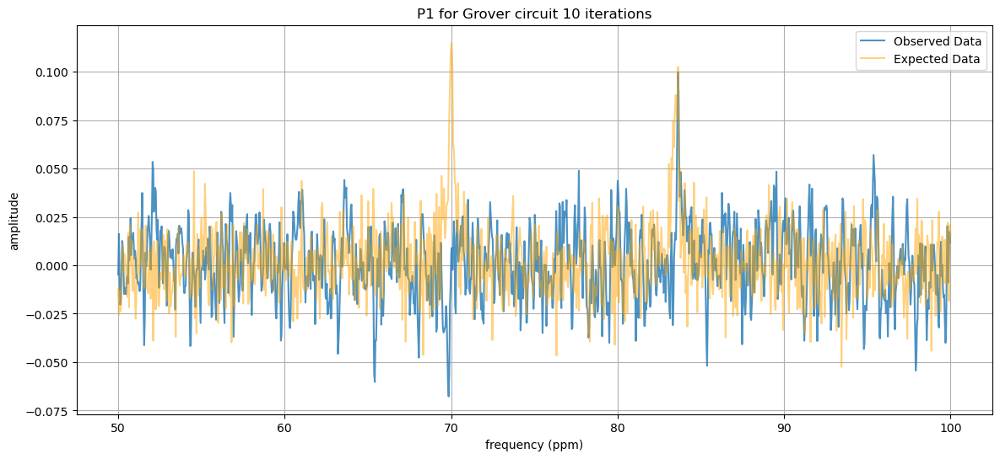

In [206]:
plot_data_and_expected("../lab_data/lab4/gr/g2_gr10_p1.csv", "frequency (ppm)", "amplitude", "P1 for Grover circuit 10 iterations", a,b,c,d )

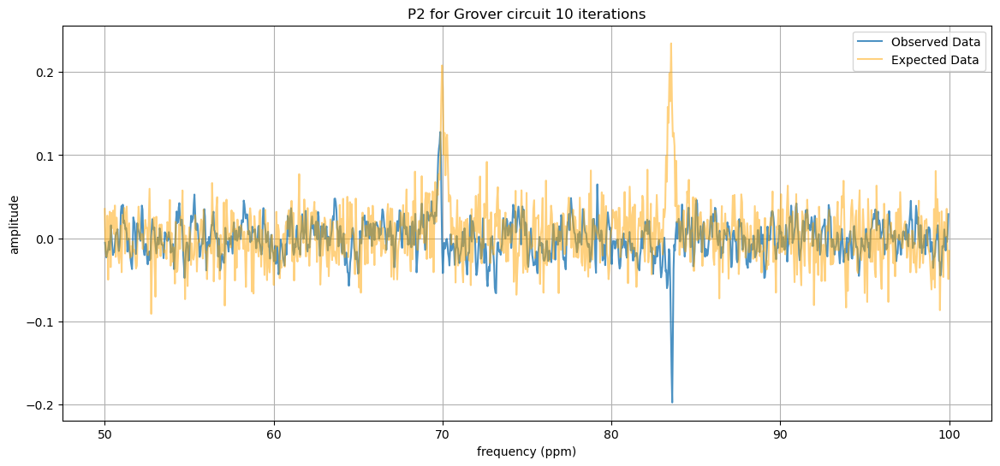

In [207]:
plot_data_and_expected("../lab_data/lab4/gr/g2_gr10_p2.csv", "frequency (ppm)", "amplitude", "P2 for Grover circuit 10 iterations", a,b,c,d )

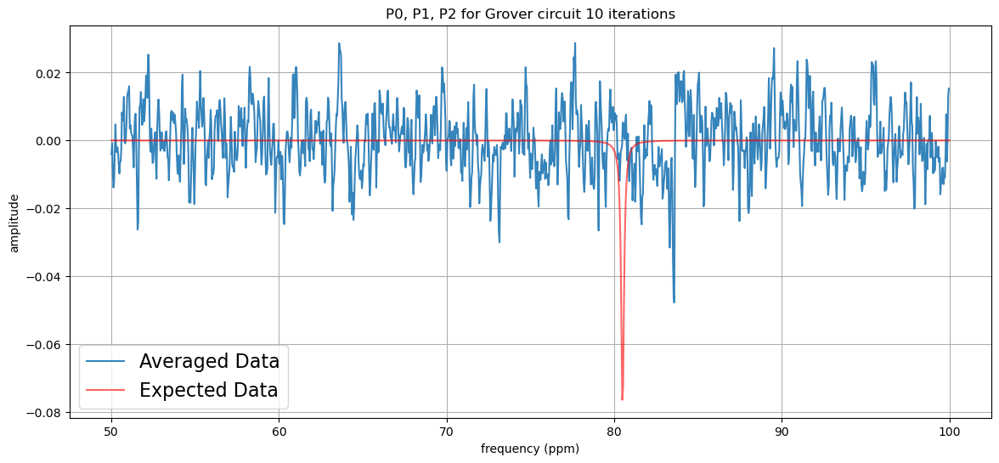

In [301]:
plot_data_with_offset("../lab_data/lab4/gr/g2_gr10_p0.csv", "../lab_data/lab4/gr/g2_gr10_p1.csv", "../lab_data/lab4/gr/g2_gr10_p2.csv", "frequency (ppm)", "amplitude", "P0, P1, P2 for Grover circuit 10 iterations", a=0,b=0,c=0,d=-d )

# Alternate data

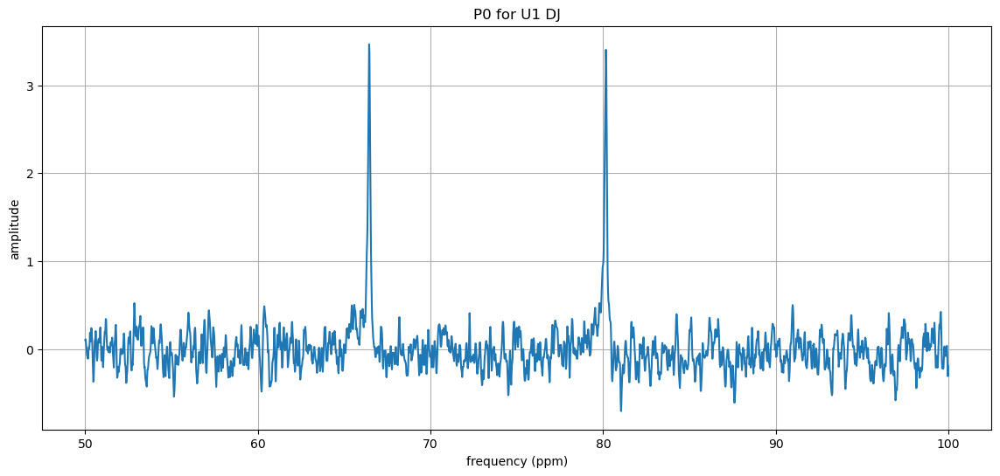

In [270]:
plot_data("../lab_data/lab4/alternate_attempt/dj_u1_p0.csv", "frequency (ppm)", "amplitude", "P0 for U1 DJ")

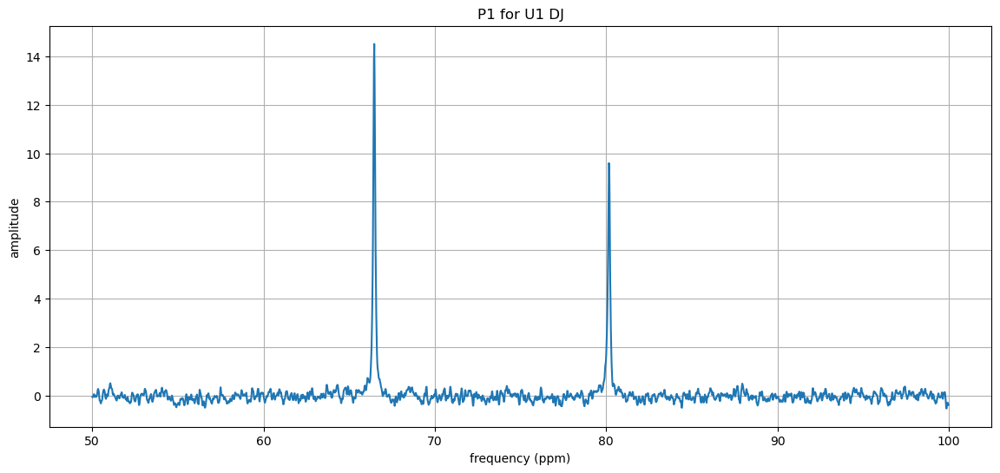

In [212]:
plot_data("../lab_data/lab4/alternate_attempt/dj_u1_p1.csv", "frequency (ppm)", "amplitude", "P1 for U1 DJ")

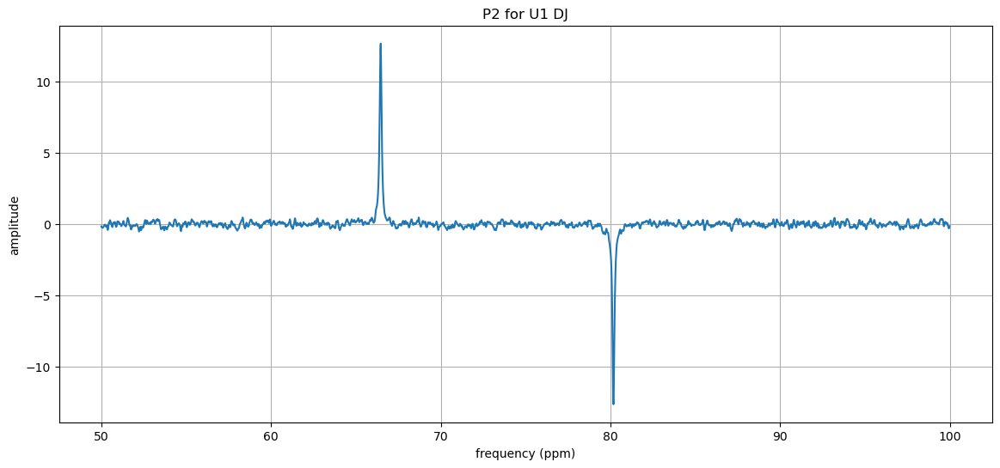

In [213]:
plot_data("../lab_data/lab4/alternate_attempt/dj_u1_p2.csv", "frequency (ppm)", "amplitude", "P2 for U1 DJ")

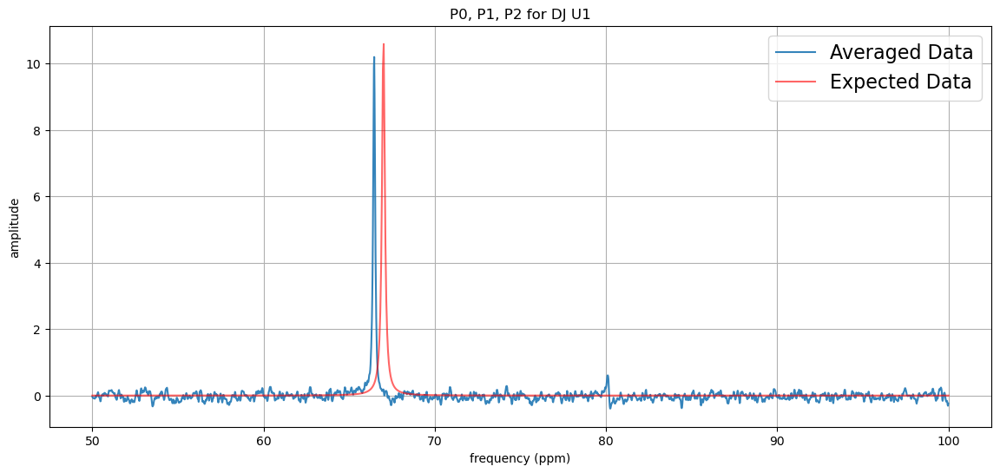

In [280]:
plot_data_with_offset("../lab_data/lab4/alternate_attempt/dj_u1_p0.csv", "../lab_data/lab4/alternate_attempt/dj_u1_p1.csv", "../lab_data/lab4/alternate_attempt/dj_u1_p2.csv", "frequency (ppm)", "amplitude", "P0, P1, P2 for DJ U1", a=a,b=0,c=0,d=0 )

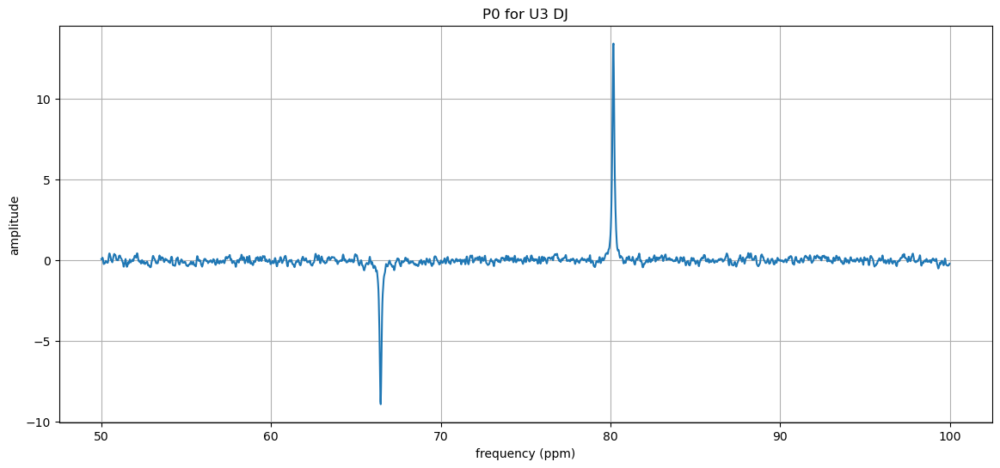

In [244]:
plot_data("../lab_data/lab4/alternate_attempt/dj_u2_p0.csv", "frequency (ppm)", "amplitude", "P0 for U3 DJ")

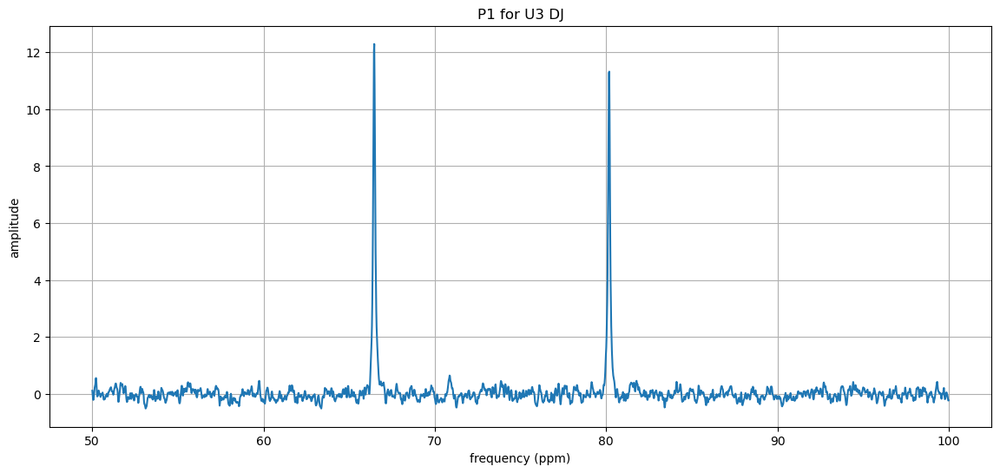

In [245]:
plot_data("../lab_data/lab4/alternate_attempt/dj_u2_p1.csv", "frequency (ppm)", "amplitude", "P1 for U3 DJ")

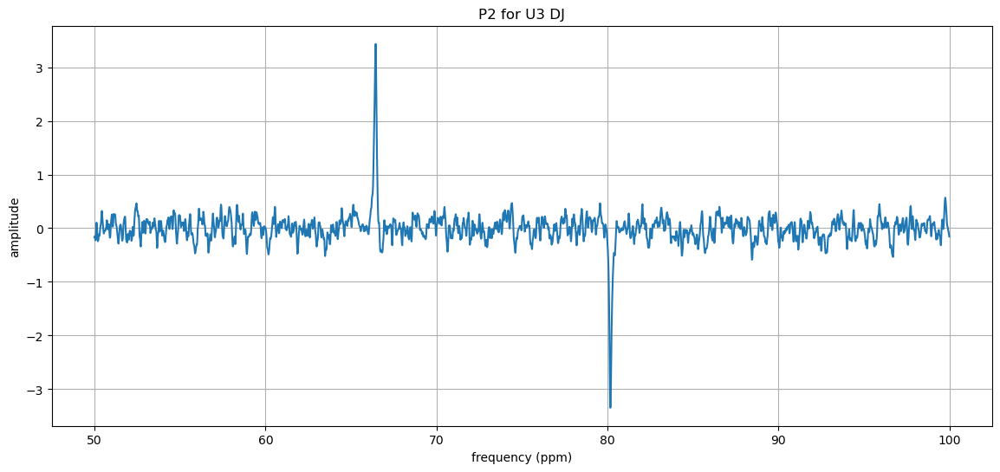

In [246]:
plot_data("../lab_data/lab4/alternate_attempt/dj_u2_p2.csv", "frequency (ppm)", "amplitude", "P2 for U3 DJ")

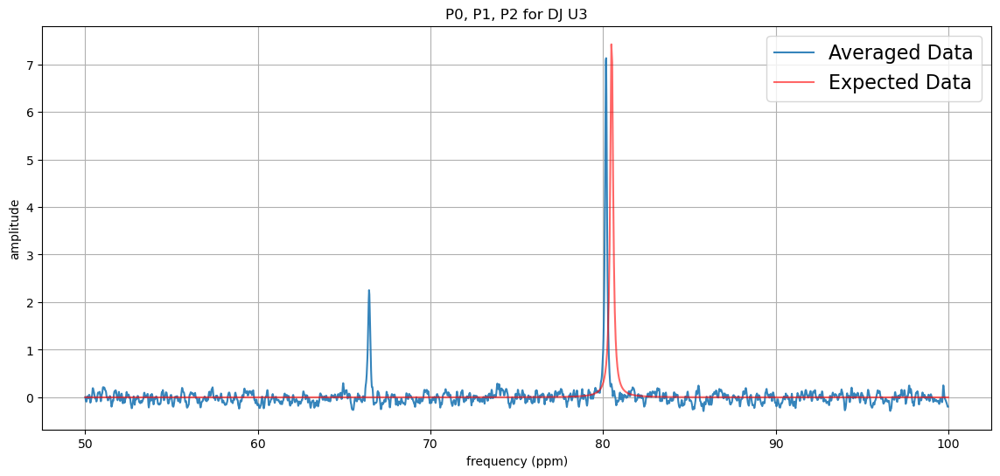

In [281]:
plot_data_with_offset("../lab_data/lab4/alternate_attempt/dj_u2_p0.csv", "../lab_data/lab4/alternate_attempt/dj_u2_p1.csv", "../lab_data/lab4/alternate_attempt/dj_u2_p2.csv", "frequency (ppm)", "amplitude", "P0, P1, P2 for DJ U3", a=0,b=0,c=0,d=d )

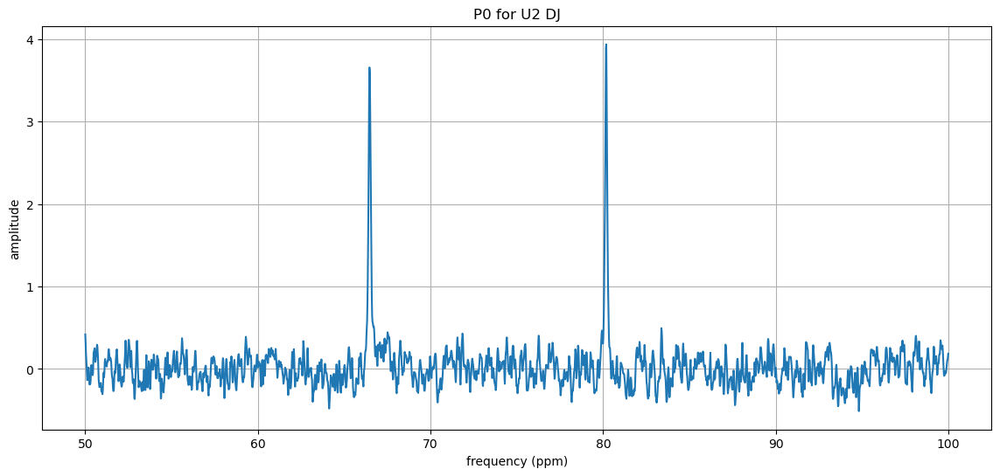

In [248]:
plot_data("../lab_data/lab4/alternate_attempt/dj_u3_p0.csv", "frequency (ppm)", "amplitude", "P0 for U2 DJ")

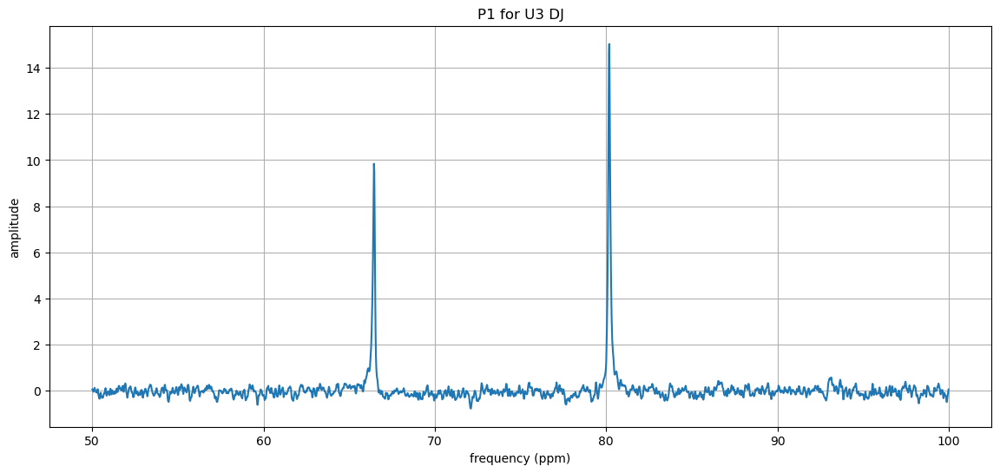

In [223]:
plot_data("../lab_data/lab4/alternate_attempt/dj_u3_p1.csv", "frequency (ppm)", "amplitude", "P1 for U3 DJ")

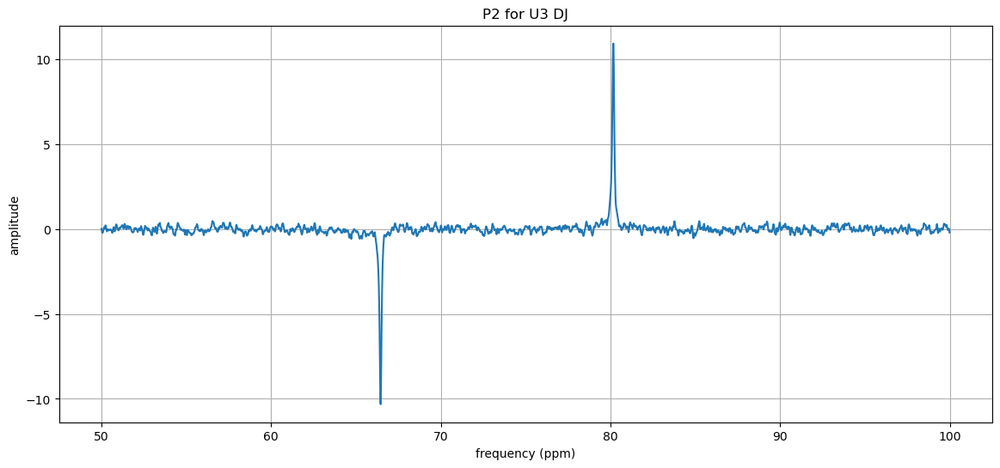

In [224]:
plot_data("../lab_data/lab4/alternate_attempt/dj_u3_p2.csv", "frequency (ppm)", "amplitude", "P2 for U3 DJ")

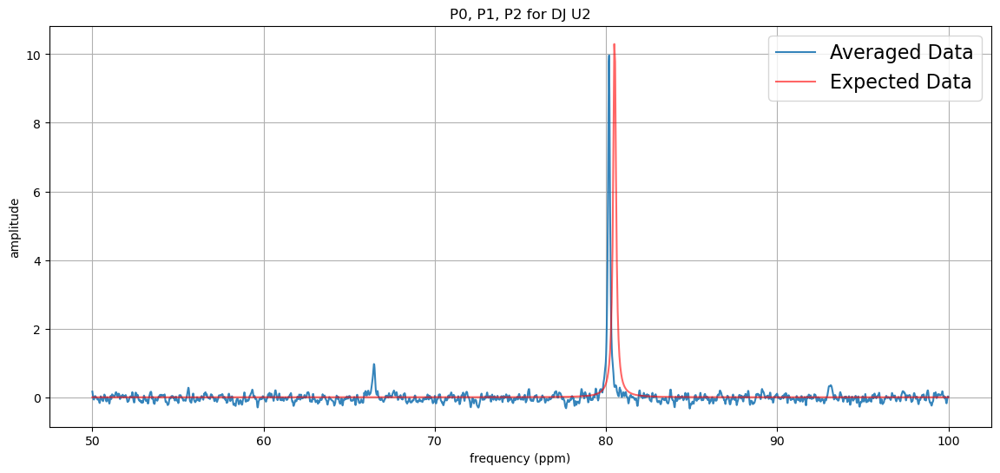

In [283]:
plot_data_with_offset("../lab_data/lab4/alternate_attempt/dj_u3_p0.csv", "../lab_data/lab4/alternate_attempt/dj_u3_p1.csv", "../lab_data/lab4/alternate_attempt/dj_u3_p2.csv", "frequency (ppm)", "amplitude", "P0, P1, P2 for DJ U2", a=0,b=0,c=0,d=d )

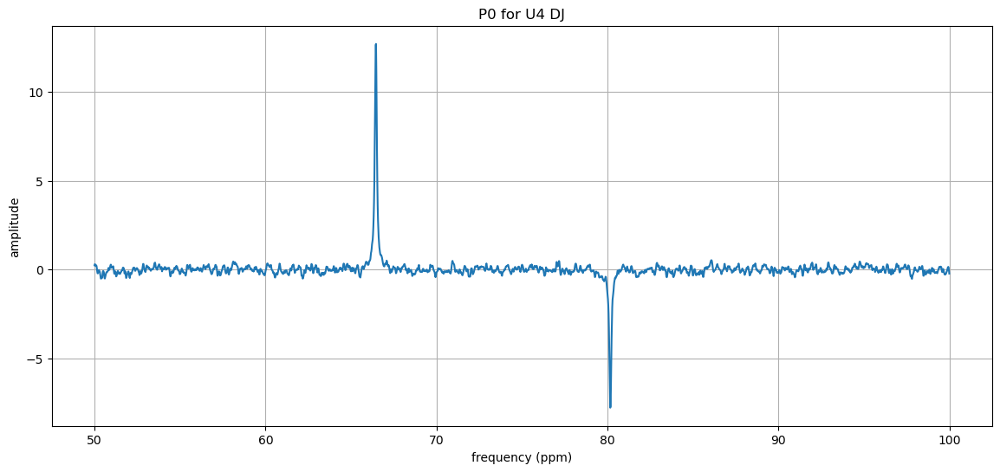

In [226]:
plot_data("../lab_data/lab4/alternate_attempt/dj_u4_p0.csv", "frequency (ppm)", "amplitude", "P0 for U4 DJ")

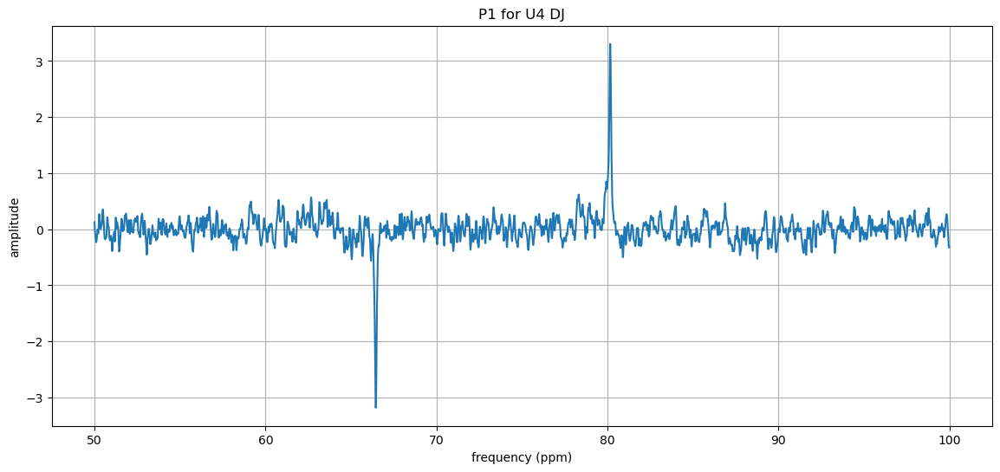

In [227]:
plot_data("../lab_data/lab4/alternate_attempt/dj_u4_p1.csv", "frequency (ppm)", "amplitude", "P1 for U4 DJ")

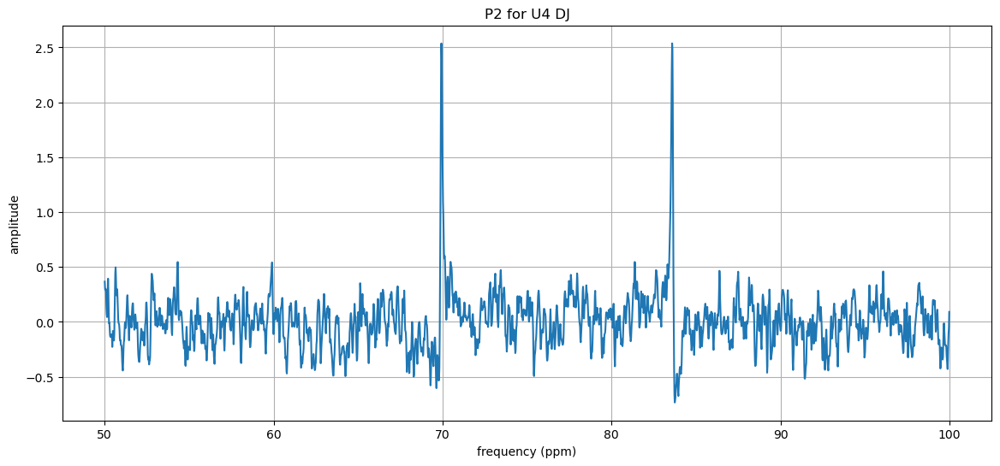

In [228]:
plot_data("../lab_data/lab4/alternate_attempt/dj_u4_p2.csv", "frequency (ppm)", "amplitude", "P2 for U4 DJ")

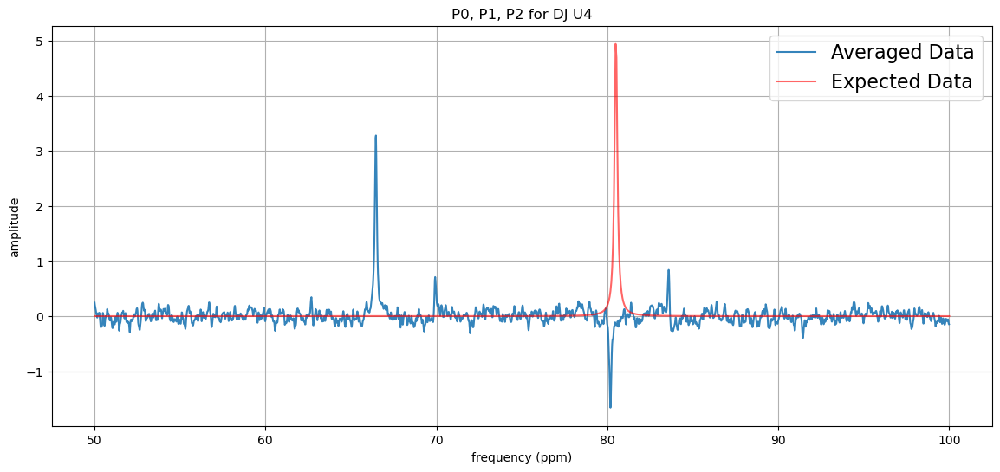

In [303]:
plot_data_with_offset("../lab_data/lab4/alternate_attempt/dj_u4_p0.csv", "../lab_data/lab4/alternate_attempt/dj_u4_p1.csv", "../lab_data/lab4/alternate_attempt/dj_u4_p2.csv", "frequency (ppm)", "amplitude", "P0, P1, P2 for DJ U4", a=0,b=0,c=0,d=d , offset3=True)

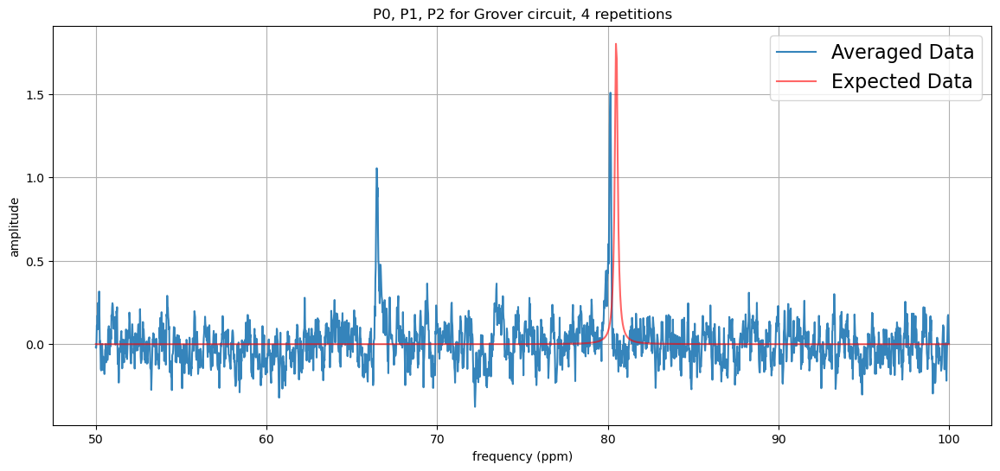

In [367]:
plot_data_with_offset("../lab_data/lab4/alternate_attempt/gr4_p0.csv", "../lab_data/lab4/alternate_attempt/gr4_p1.csv", "../lab_data/lab4/alternate_attempt/gr4_p2.csv", "frequency (ppm)", "amplitude", "P0, P1, P2 for Grover circuit, 4 repetitions", a=0,b=0,c=0,d=d , flip1=True, flip3=True)

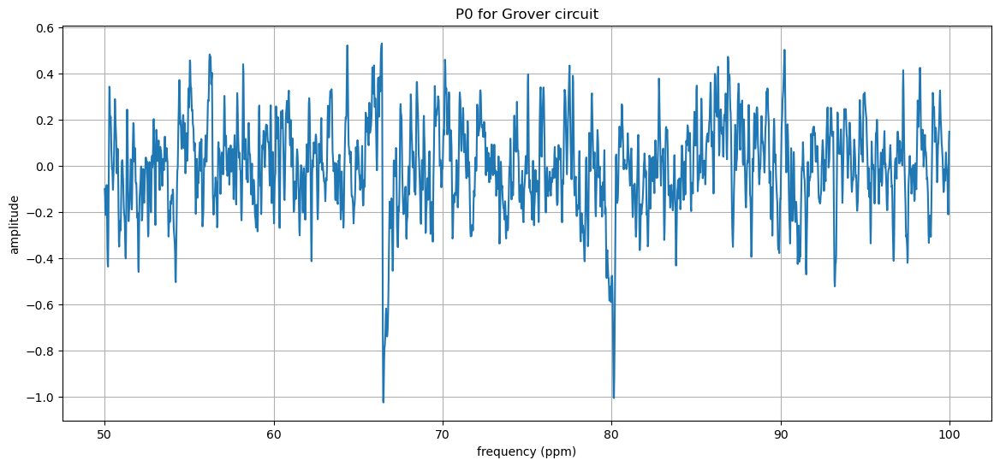

In [336]:
plot_data("../lab_data/lab4/alternate_attempt/gr4_p0.csv", "frequency (ppm)", "amplitude", "P0 for Grover circuit")

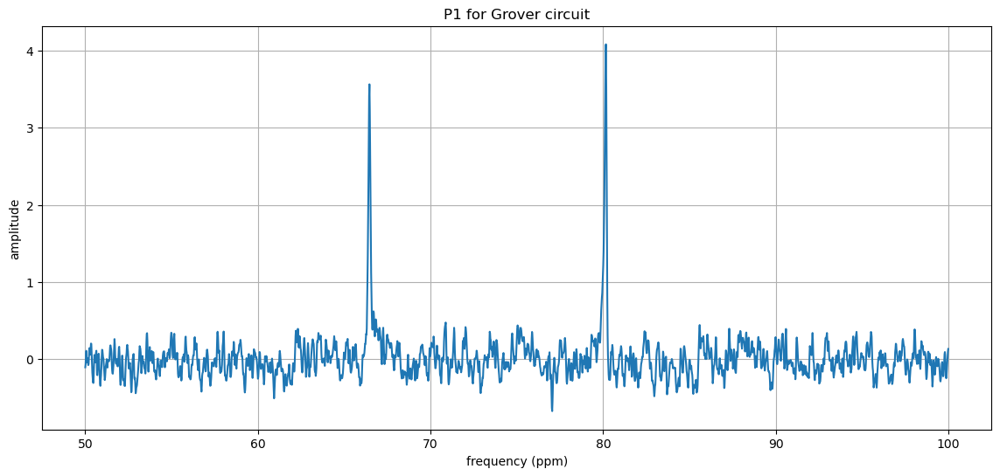

In [331]:
plot_data("../lab_data/lab4/alternate_attempt/gr4_p1.csv", "frequency (ppm)", "amplitude", "P1 for Grover circuit")

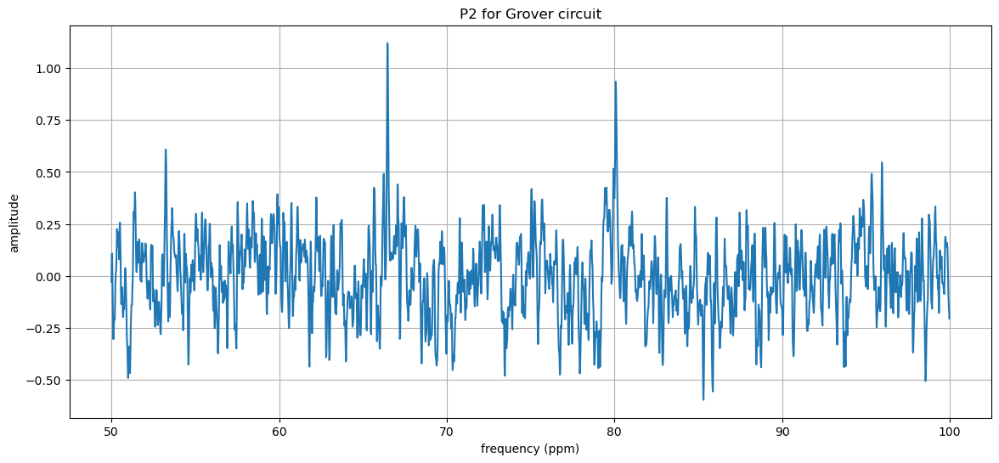

In [332]:
plot_data("../lab_data/lab4/alternate_attempt/gr4_p2.csv", "frequency (ppm)", "amplitude", "P2 for Grover circuit")

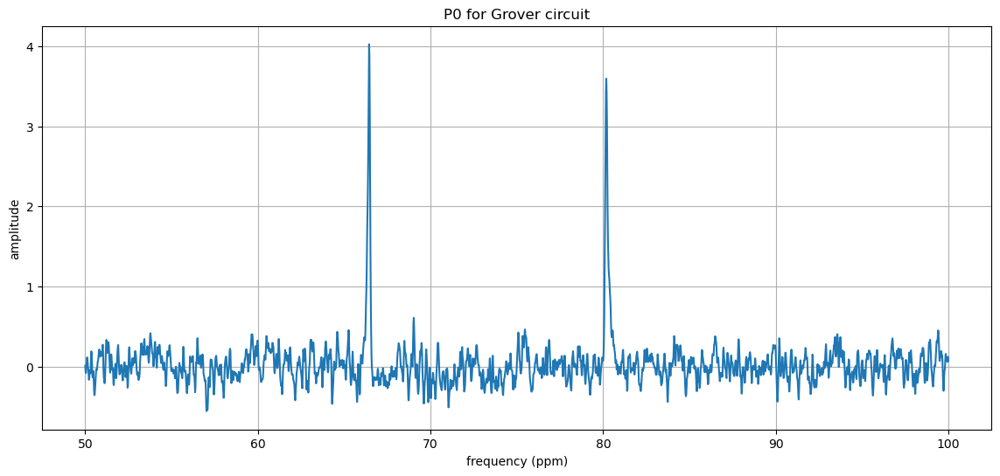

In [342]:
plot_data("../lab_data/lab4/alternate_attempt/gr7_p0.csv", "frequency (ppm)", "amplitude", "P0 for Grover circuit")

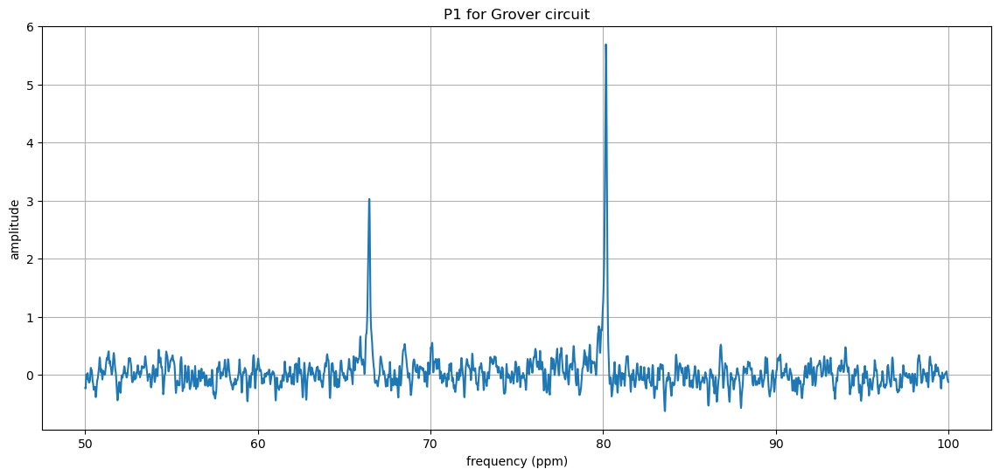

In [343]:
plot_data("../lab_data/lab4/alternate_attempt/gr7_p1.csv", "frequency (ppm)", "amplitude", "P1 for Grover circuit")

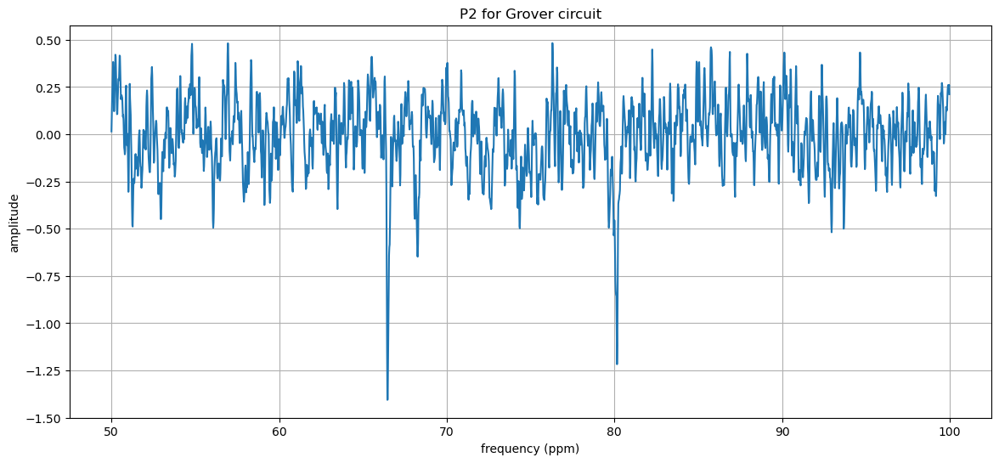

In [344]:
plot_data("../lab_data/lab4/alternate_attempt/gr7_p2.csv", "frequency (ppm)", "amplitude", "P2 for Grover circuit")

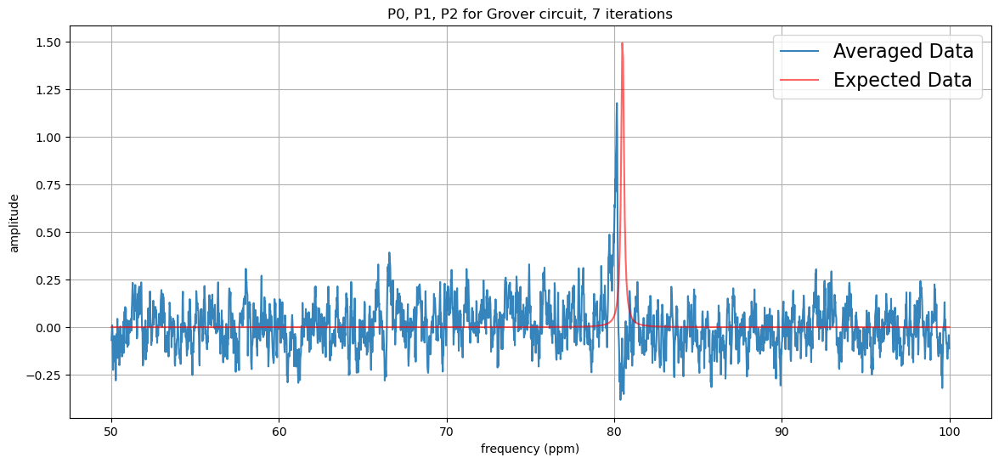

In [376]:
plot_data_with_offset("../lab_data/lab4/alternate_attempt/gr7_p0.csv", "../lab_data/lab4/alternate_attempt/gr7_p1.csv", "../lab_data/lab4/alternate_attempt/gr7_p2.csv", "frequency (ppm)", "amplitude", "P0, P1, P2 for Grover circuit, 7 iterations", a=0,b=0,c=0,d=d, flip1=True, flip3=True)